In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import re

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import logit, ols

from src.analysis.state_space import StateSpaceAnalysisSpec
from src.utils import concat_csv_with_indices

In [4]:
sns.set_context("paper", font_scale=2)

In [5]:
false_friends_path = "outputs/analogy/inputs/librispeech-train-clean-100/w2v2/false_friends.csv"
state_space_path = "outputs/analogy/inputs/librispeech-train-clean-100/w2v2/state_space_spec.h5"
most_common_allomorphs_path = "outputs/analogy/inputs/librispeech-train-clean-100/w2v2/most_common_allomorphs.csv"
cross_instances_path = "outputs/analogy/inputs/librispeech-train-clean-100/w2v2/all_cross_instances.parquet"
output_dir = "analogy_figures"

In [6]:
# Grouping variables on experiment results dataframe to select a single run
run_groupers = ["base_model_name", "model_name", "equivalence"]

eval_dataset = "librispeech-train-clean-100"

# plot_runs = [(f"w2v2_{i}", "ff_32", "word_broad_10frames_fixedlen25") for i in range(12)] + \
#             [(f"w2v2_{i}", "discrim-ff_32", "word_broad_10frames_fixedlen25") for i in range(12)] + \
#             [(f"w2v2_{i}", "id", "id") for i in range(12)] + \
#             [(f"w2v2_{i}", "ffff_32", "word_broad_10frames_fixedlen25") for i in range(12)]
plot_runs = [(f"w2v2_{i}", "ffff_32", "word_broad_10frames_fixedlen25") for i in range(12)] + \
             [(f"w2v2_{i}", "id", "id") for i in range(12)]
# plot_runs = [("w2v2_8", "ff_32", "word_broad_10frames_fixedlen25"),]

main_plot_run = ("w2v2_8", "ffff_32", "word_broad_10frames_fixedlen25")
foil_plot_run = ("w2v2_8", "id", "id")
main_plot_name = "Word"
foil_plot_name = "Wav2Vec"
# main_plot_run = ("w2v2_8", "discrim-ff_32", "word_broad_10frames_fixedlen25")
# choose a vmin, vmax so that all heatmaps have the same color scale
main_plot_vmin, main_plot_vmax = 0.4, 0.9

plot_inflections = ["NNS", "VBZ"]
plot_metrics = ["correct", "gt_label_rank", "gt_distance"]
plot_metrics_pretty = {
    "correct": "Accuracy",
    "gt_label_rank": "Rank",
    "gt_distance": "Cosine distance",
}

## Load metadata

In [7]:
word_freq_df = pd.read_csv("data/WorldLex_Eng_US.Freq.2.txt", sep="\t", index_col="Word")
# compute weighted average frequency across domains
word_freq_df["BlogFreq_rel"] = word_freq_df.BlogFreq / word_freq_df.BlogFreq.sum()
word_freq_df["TwitterFreq_rel"] = word_freq_df.TwitterFreq / word_freq_df.TwitterFreq.sum()
word_freq_df["NewsFreq_rel"] = word_freq_df.NewsFreq / word_freq_df.NewsFreq.sum()
word_freq_df["Freq"] = word_freq_df[["BlogFreq_rel", "TwitterFreq_rel", "NewsFreq_rel"]].mean(axis=1) \
    * word_freq_df[["BlogFreq", "TwitterFreq", "NewsFreq"]].sum().mean()
word_freq_df["LogFreq"] = np.log10(word_freq_df.Freq)

In [8]:
false_friends_df = pd.read_csv(false_friends_path)

In [9]:
most_common_allomorphs = pd.read_csv(most_common_allomorphs_path)

In [10]:
all_cross_instances = pd.read_parquet(cross_instances_path)

## Load results

In [11]:
all_results = concat_csv_with_indices(
        "outputs/analogy/runs/**/experiment_results.csv",
        [lambda p: p.parent.name,
         lambda p: p.parents[1].name,
         lambda p: p.parents[2].name,
         lambda p: p.parents[3].name],
        ["test_dataset", "equivalence", "model_name", "base_model_name"]) \
    .droplevel(-1).reset_index()

/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarni

In [12]:
all_id_results = concat_csv_with_indices(
        "outputs/analogy/runs_id/**/experiment_results.csv",
        [lambda p: p.parent.name],
        ["base_model_name"]) \
    .droplevel(-1).reset_index()
all_id_results["model_name"] = "id"
all_id_results["equivalence"] = "id"

/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [reader(p, **kwargs) for p in paths]
/userdata/jgauthier/projects/ideal-word-representations/src/utils/__init__.py:38: DtypeWarni

In [13]:
all_results = pd.concat([all_results, all_id_results], ignore_index=True)

In [14]:
# Select only eval dataset.
all_results["test_dataset"] = all_results.test_dataset.fillna(eval_dataset)
all_results = all_results[all_results.test_dataset == eval_dataset]

In [15]:
all_results["group"] = all_results.group.apply(lambda x: eval(x) if not (isinstance(x, float) and np.isnan(x)) else None)
all_results = all_results.reset_index()

### Exclusions

In [16]:
# post-hoc exclude some words which have base/inflected forms which are homophonous with items of another category
exclusions = [
    ("VBZ", "know"), # nose
    ("VBZ", "seem"), # seam
    ("VBZ", "please"), # pleas
    ("VBZ", "write"), # right
    ("VBZ", "meet"), # meat
    ("VBZ", "read"), # reed
]

In [17]:
# anti join
all_results = all_results.merge(pd.DataFrame(exclusions, columns=["inflection_from", "base_from"]),
                  on=["inflection_from", "base_from"], how="left", indicator=True) \
    .query("_merge == 'left_only'").drop(columns="_merge") \
    .merge(pd.DataFrame(exclusions, columns=["inflection_to", "base_to"]),
           on=["inflection_to", "base_to"], how="left", indicator=True) \
    .query("_merge == 'left_only'").drop(columns="_merge")

### Layer-wise

In [18]:
plot_lw = all_results.query("experiment == 'regular'").copy()
plot_lw = plot_lw.groupby(run_groupers + ["group", "inflection_from"])[["correct", "gt_label_rank", "gt_distance"]].mean()
plot_lw = plot_lw.reindex([(*plot_run, group, inflection_from)
                           for group in plot_lw.index.get_level_values("group").unique()
                           for inflection_from in plot_lw.index.get_level_values("inflection_from").unique()
                           for plot_run in plot_runs]).reset_index()
plot_lw["group0"] = plot_lw.group.apply(lambda x: x[0] if x is not None else None)
plot_lw["group1"] = plot_lw.group.apply(lambda x: x[1] if x is not None else None)
plot_lw["layer"] = plot_lw.base_model_name.str.extract(r"_(\d+)$").astype(int) + 1
plot_lw["model_name"] = plot_lw["model_name"].map({"id": "Wav2Vec", main_plot_run[1]: "Word"})

lw_random = plot_lw[plot_lw.group0 == "random"].groupby(["inflection_from", "layer"])[["correct", "gt_label_rank"]].mean().reset_index().dropna()

plot_lw = plot_lw[plot_lw.inflection_from.isin(plot_inflections)]
plot_lw = plot_lw[(plot_lw.group1 == True)]

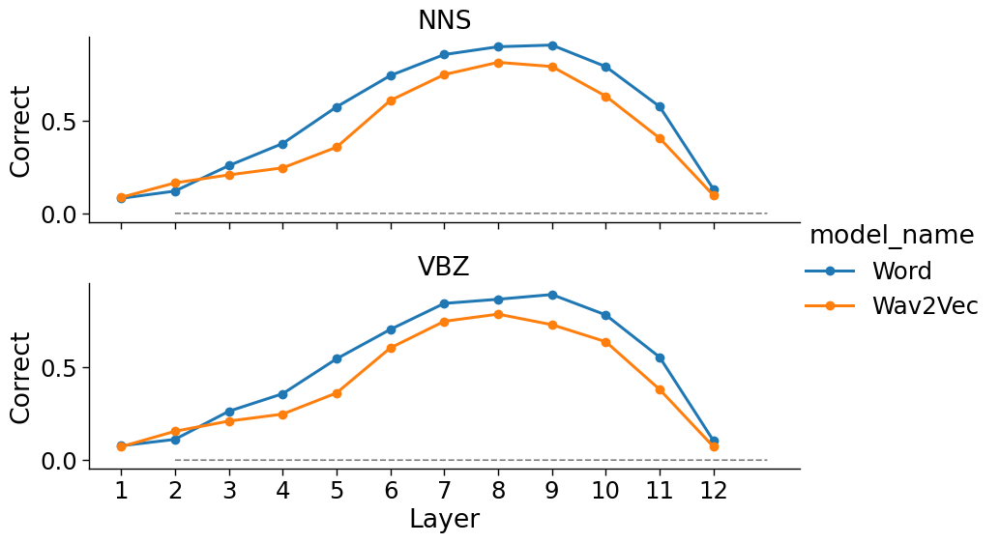

In [19]:
g = sns.catplot(data=plot_lw, x="layer", y="correct", hue="model_name", row="inflection_from",
                kind="point", height=3, aspect=3)

for ax, row_name in zip(g.axes.flat, g.row_names):
    sns.lineplot(data=lw_random,
                 x="layer", y="correct", ax=ax, color="gray", linestyle="--",
                 legend=None)
    ax.set_title(ax.get_title().split("=")[1].strip())
    ax.set_ylabel("Correct")
    if ax.get_xlabel() == "layer":
        ax.set_xlabel("Layer")

# g.figure.tight_layout()
g.figure.savefig(f"{output_dir}/layer_wise.pdf")

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/

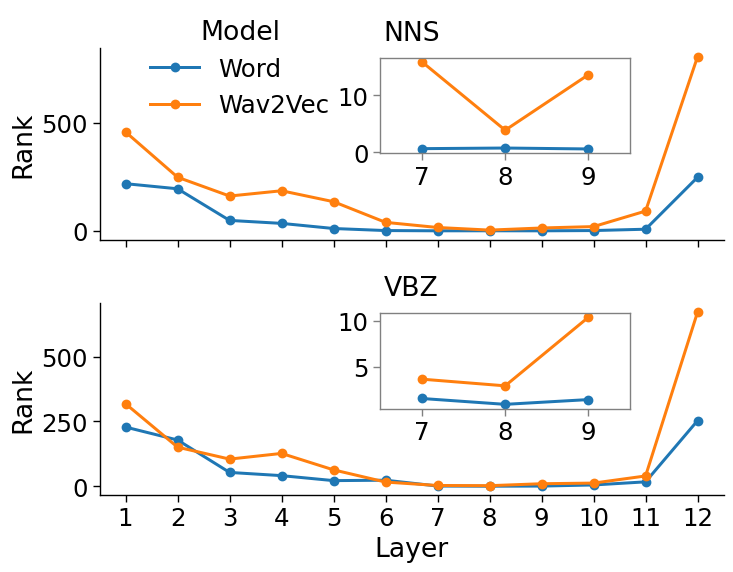

In [20]:
hue_order = ["Word", "Wav2Vec"]
g = sns.catplot(data=plot_lw, x="layer", y="gt_label_rank",
                hue="model_name", hue_order=hue_order,
                row="inflection_from", row_order=plot_inflections,
                kind="point", sharey=False, height=3, aspect=1.25)

for (row, col, hue), data in g.facet_data():
    ax = g.axes[row, col]
    ax.set_title(ax.get_title().split("=")[1].strip())
    ax.set_ylabel("Rank")
    if ax.get_xlabel() == "layer":
        ax.set_xlabel("Layer")

    # Add an inset showing the middle layers
    inset_ax = ax.inset_axes([0.45, 0.45, 0.4, 0.5])
    sns.pointplot(data=data[data.layer.between(7, 9)], x="layer", y="gt_label_rank",
                  hue="model_name", hue_order=hue_order,
                  ax=inset_ax, legend=None)
    inset_ax.set_xlabel(None)
    inset_ax.set_ylabel(None)
    for spine in inset_ax.spines.values():
        spine.set_edgecolor("gray")
    inset_ax.tick_params(color="gray")

g.legend.remove()
g.add_legend(title="Model", bbox_to_anchor=(0.19, 0.99), loc="upper left")
g.figure.tight_layout()
g.figure.savefig(f"{output_dir}/layer_wise-rank.pdf")

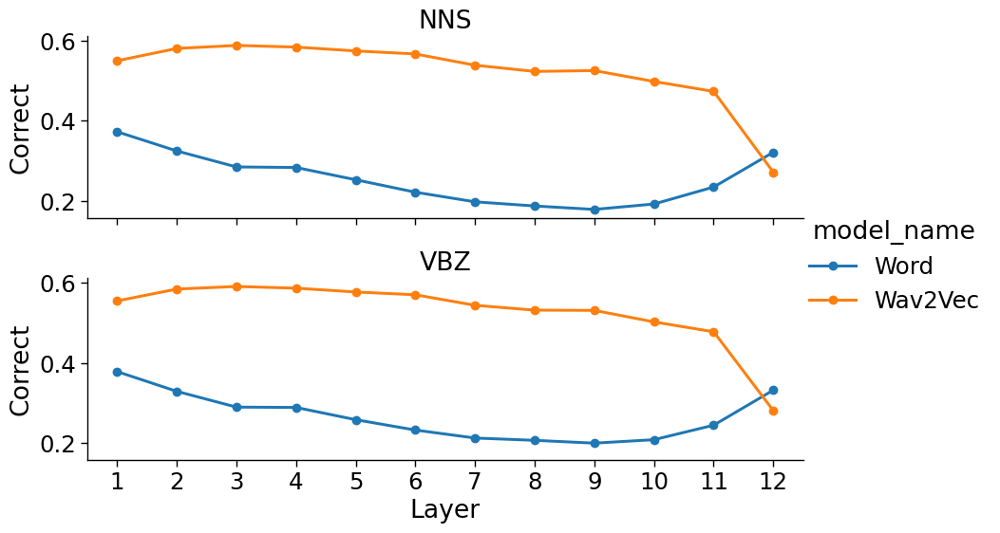

In [21]:
g = sns.catplot(data=plot_lw, x="layer", y="gt_distance", hue="model_name", row="inflection_from",
                kind="point", height=3, aspect=3)

for ax, row_name in zip(g.axes.flat, g.row_names):
    # sns.lineplot(data=lw_random,
    #              x="layer", y="gt_label_rank", ax=ax, color="gray", linestyle="--",
    #              legend=None)
    ax.set_title(ax.get_title().split("=")[1].strip())
    ax.set_ylabel("Correct")
    if ax.get_xlabel() == "layer":
        ax.set_xlabel("Layer")

# g.figure.tight_layout()
g.figure.savefig(f"{output_dir}/layer_wise-distance.pdf")

## Compute controlled NNVB results

In [22]:
all_nnvb_results = []

for run, run_results in all_results.groupby(run_groupers):
    run_results = run_results.set_index("experiment")
    nnvb_expts = run_results.index.unique()
    nnvb_expts = nnvb_expts[nnvb_expts.str.contains("unambiguous-")]

    for expt in nnvb_expts:
        inflection_from, allomorph_from, inflection_to, allomorph_to = \
            re.findall(r"unambiguous-(\w+)_([\w\s]+)_to_(\w+)_([\w\s]+)", expt)[0]
        expt_df = run_results.loc[[expt]].copy()

        num_seen_words = min(len(expt_df.base_from.unique()), len(expt_df.base_to.unique()))
        # DEV
        # if num_seen_words < 10:
        #     print(f"Skipping {expt} due to only {num_seen_words} seen words")
        #     continue

        expt_df["inflection_from"] = inflection_from
        expt_df["allomorph_from"] = allomorph_from
        expt_df["inflection_to"] = inflection_to
        expt_df["allomorph_to"] = allomorph_to

        all_nnvb_results.append(expt_df)

all_nnvb_results = pd.concat(all_nnvb_results)

all_nnvb_results["inflected_from"] = all_nnvb_results.from_equiv_label.apply(lambda x: eval(x)[1])
all_nnvb_results["inflected_to"] = all_nnvb_results.to_equiv_label.apply(lambda x: eval(x)[1])

all_nnvb_results = pd.merge(all_nnvb_results, word_freq_df.LogFreq.rename("from_base_freq"),
                            left_on="base_from", right_index=True)
all_nnvb_results = pd.merge(all_nnvb_results, word_freq_df.LogFreq.rename("from_inflected_freq"),
                            left_on="inflected_from", right_index=True)
all_nnvb_results = pd.merge(all_nnvb_results, word_freq_df.LogFreq.rename("to_base_freq"),
                              left_on="base_to", right_index=True)
all_nnvb_results = pd.merge(all_nnvb_results, word_freq_df.LogFreq.rename("to_inflected_freq"),
                            left_on="inflected_to", right_index=True)

all_nnvb_results["from_freq"] = all_nnvb_results[["from_base_freq", "from_inflected_freq"]].mean(axis=1)
all_nnvb_results["to_freq"] = all_nnvb_results[["to_base_freq", "to_inflected_freq"]].mean(axis=1)

_, frequency_bins = pd.qcut(pd.concat([all_nnvb_results.to_freq, all_nnvb_results.from_freq]), q=5, retbins=True)
all_nnvb_results["to_freq_bin"] = pd.cut(all_nnvb_results.to_freq, bins=frequency_bins, labels=[f"Q{i}" for i in range(1, 6)])
all_nnvb_results["from_freq_bin"] = pd.cut(all_nnvb_results.from_freq, bins=frequency_bins, labels=[f"Q{i}" for i in range(1, 6)])

In [23]:
def summarize_nnvb_run(rows):
    rows["source_label"] = rows.inflection_from + " " + rows.allomorph_from
    rows["target_label"] = rows.inflection_to + " " + rows.allomorph_to

    rows["transfer_label"] = rows.inflection_from + " -> " + rows.inflection_to
    rows["phon_label"] = rows.allomorph_from + " " + rows.allomorph_to

    # only retain cases where we have data in both transfer directions from source <-> target within inflection
    rows["complement_exists"] = rows.apply(lambda row: len(rows.query("source_label == @row.target_label and target_label == @row.source_label")), axis=1)
    rows = rows.query("complement_exists > 0").drop(columns=["complement_exists"])

    return rows

summary_groupers = ["inflection_from", "inflection_to", "allomorph_from", "allomorph_to"]
nnvb_results_summary = all_nnvb_results.groupby(run_groupers + summary_groupers) \
    .correct.agg(["count", "mean"]) \
    .query("count >= 0") \
    .reset_index(summary_groupers) \
    .groupby(run_groupers, group_keys=False) \
    .apply(summarize_nnvb_run) \
    .reset_index()

nnvb_results_summary

,base_model_name,model_name,equivalence,inflection_from,inflection_to,allomorph_from,allomorph_to,count,mean,source_label,target_label,transfer_label,phon_label
0,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,NNS,NNS,IH Z,IH Z,1000,0.078000,NNS IH Z,NNS IH Z,NNS -> NNS,IH Z IH Z
1,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,NNS,NNS,IH Z,S,1000,0.020000,NNS IH Z,NNS S,NNS -> NNS,IH Z S
2,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,NNS,NNS,IH Z,Z,1000,0.048000,NNS IH Z,NNS Z,NNS -> NNS,IH Z Z
3,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,NNS,NNS,S,IH Z,1000,0.021000,NNS S,NNS IH Z,NNS -> NNS,S IH Z
4,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,NNS,NNS,S,S,1000,0.058000,NNS S,NNS S,NNS -> NNS,S S
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBZ,VBZ,S,S,132,0.462121,VBZ S,VBZ S,VBZ -> VBZ,S S
1796,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBZ,VBZ,S,Z,444,0.463964,VBZ S,VBZ Z,VBZ -> VBZ,S Z
1797,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBZ,VBZ,Z,IH Z,111,0.216216,VBZ Z,VBZ IH Z,VBZ -> VBZ,Z IH Z
1798,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBZ,VBZ,Z,S,444,0.423423,VBZ Z,VBZ S,VBZ -> VBZ,Z S


In [24]:
# plot_results = []
# for base_model_name, model_name, equivalence in plot_runs:
#     results_i = nnvb_results_summary.query("base_model_name == @base_model_name and model_name == @model_name and equivalence == @equivalence")
#     if len(results_i) > 0:
#         plot_results.append(results_i)
# num_plot_runs = len(plot_results)

# ncols = 4
# nrows = int(np.ceil(num_plot_runs / ncols))
# f, axs = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))

# for ax, results_i in zip(axs.flat, plot_results):
#     sns.heatmap(results_i.set_index(["source_label", "target_label"])["mean"].unstack(),
#                 vmin=0, vmax=1, ax=ax)
#     key_row = results_i.iloc[0]
#     ax.set_title(f"{key_row.base_model_name} -> {key_row.model_name} ({key_row.equivalence})")

### Focused plots

In [25]:
focus_base_model, focus_model, focus_equivalence = main_plot_run
foil_base_model, foil_model, foil_equivalence = "w2v2_8", "id", "id"

nnvb_focus = all_nnvb_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")
nnvb_foil = all_nnvb_results.query("base_model_name == @foil_base_model and model_name == @foil_model and equivalence == @foil_equivalence")
nnvb_focus["model_label"] = "Word"
nnvb_foil["model_label"] = "Wav2Vec"

nnvb_focus = pd.concat([nnvb_focus, nnvb_foil])

allomorph_labels = {"Z": "z", "S": "s", "IH Z": "ɪz"}
nnvb_focus["allomorph_from"] = nnvb_focus.allomorph_from.map(allomorph_labels)
nnvb_focus["allomorph_to"] = nnvb_focus.allomorph_to.map(allomorph_labels)
nnvb_focus

/tmp/ipykernel_1259256/3874715788.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nnvb_focus["model_label"] = "Word"
/tmp/ipykernel_1259256/3874715788.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nnvb_foil["model_label"] = "Wav2Vec"


,index,test_dataset,equivalence,model_name,base_model_name,Unnamed: 1,group,from_equiv_label,to_equiv_label,base_from,...,inflected_to,from_base_freq,from_inflected_freq,to_base_freq,to_inflected_freq,from_freq,to_freq,to_freq_bin,from_freq_bin,model_label
experiment,,,,,,,,,,,,,,,,,,,,,
unambiguous-NNS_Z_to_NNS_Z,348522,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,0,None,"('champion', 'champions')","('sister', 'sisters')",champion,...,sisters,3.072201,2.776376,3.562180,3.029285,2.924288,3.295732,Q4,Q3,Word
unambiguous-NNS_Z_to_NNS_Z,348523,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,1,None,"('vision', 'visions')","('year', 'years')",vision,...,years,3.167735,2.313886,4.604756,4.483577,2.740811,4.544167,Q5,Q3,Word
unambiguous-NNS_Z_to_NNS_Z,348524,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,2,None,"('mosquito', 'mosquitoes')","('obstacle', 'obstacles')",mosquito,...,obstacles,1.994471,1.877280,2.267185,2.452280,1.935876,2.359732,Q2,Q1,Word
unambiguous-NNS_Z_to_NNS_Z,348525,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,3,None,"('individual', 'individuals')","('contemporary', 'contemporaries')",individual,...,contemporaries,3.343798,3.120148,2.927520,1.738005,3.231973,2.332762,Q2,Q4,Word
unambiguous-NNS_Z_to_NNS_Z,348526,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,4,None,"('grave', 'graves')","('energy', 'energies')",grave,...,energies,2.624673,2.264569,3.681008,2.041784,2.444621,2.861396,Q3,Q2,Word
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unambiguous-VBZ_IH Z_to_VBZ_IH Z,4682225,librispeech-train-clean-100,id,id,w2v2_8,1,None,"('possess', 'possesses')","('arise', 'arises')",possess,...,arises,2.358042,1.914070,2.340779,1.982065,2.136056,2.161422,Q1,Q1,Wav2Vec
unambiguous-VBZ_IH Z_to_VBZ_IH Z,4682226,librispeech-train-clean-100,id,id,w2v2_8,2,None,"('arise', 'arises')","('do', 'does')",arise,...,does,2.340779,1.982065,4.914018,4.245719,2.161422,4.579869,Q5,Q1,Wav2Vec
unambiguous-VBZ_IH Z_to_VBZ_IH Z,4682228,librispeech-train-clean-100,id,id,w2v2_8,4,None,"('do', 'does')","('possess', 'possesses')",do,...,possesses,4.914018,4.245719,2.358042,1.914070,4.579869,2.136056,Q1,Q5,Wav2Vec


In [26]:
nnvb_results_summary = nnvb_focus.groupby(["model_label", "inflection_from", "inflection_to",
                                             "allomorph_from", "allomorph_to"]) \
    [plot_metrics].mean() \
    .reset_index()

nnvb_results_summary["source_label"] = nnvb_results_summary.inflection_from.map({"NNS": "Noun", "VBZ": "Verb"}) + "\n[" + nnvb_results_summary.allomorph_from + "]"
nnvb_results_summary["target_label"] = nnvb_results_summary.inflection_to.map({"NNS": "Noun", "VBZ": "Verb"}) + "\n[" + nnvb_results_summary.allomorph_to + "]"

nnvb_results_summary["transfer_label"] = nnvb_results_summary.inflection_from + " -> " + nnvb_results_summary.inflection_to
nnvb_results_summary["phon_label"] = nnvb_results_summary.allomorph_from + " " + nnvb_results_summary.allomorph_to

# only retain cases where we have data in both transfer directions from source <-> target within inflection
nnvb_results_summary["complement_exists"] = nnvb_results_summary.apply(lambda row: len(nnvb_results_summary.query("source_label == @row.target_label and target_label == @row.source_label")), axis=1)
nnvb_results_summary = nnvb_results_summary.query("complement_exists > 0").drop(columns=["complement_exists"])

# drop VBZ IH Z, which only has 4 word types
nnvb_results_summary = nnvb_results_summary[(nnvb_results_summary.source_label != "Verb\n[ɪz]") & (nnvb_results_summary.target_label != "Verb\n[ɪz]")]

nnvb_results_summary

,model_label,inflection_from,inflection_to,allomorph_from,allomorph_to,correct,gt_label_rank,gt_distance,source_label,target_label,transfer_label,phon_label
0,Wav2Vec,NNS,NNS,s,s,0.891000,41.412000,0.497062,Noun\n[s],Noun\n[s],NNS -> NNS,s s
1,Wav2Vec,NNS,NNS,s,z,0.890855,8.117011,0.494704,Noun\n[s],Noun\n[z],NNS -> NNS,s z
2,Wav2Vec,NNS,NNS,s,ɪz,0.735793,4.188435,0.490695,Noun\n[s],Noun\n[ɪz],NNS -> NNS,s ɪz
3,Wav2Vec,NNS,NNS,z,s,0.871190,0.632252,0.506252,Noun\n[z],Noun\n[s],NNS -> NNS,z s
4,Wav2Vec,NNS,NNS,z,z,0.898585,1.251572,0.499911,Noun\n[z],Noun\n[z],NNS -> NNS,z z
5,Wav2Vec,NNS,NNS,z,ɪz,0.755471,1.825880,0.488507,Noun\n[z],Noun\n[ɪz],NNS -> NNS,z ɪz
6,Wav2Vec,NNS,NNS,ɪz,s,0.734796,1.914257,0.512403,Noun\n[ɪz],Noun\n[s],NNS -> NNS,ɪz s
7,Wav2Vec,NNS,NNS,ɪz,z,0.815414,2.159848,0.490746,Noun\n[ɪz],Noun\n[z],NNS -> NNS,ɪz z
8,Wav2Vec,NNS,NNS,ɪz,ɪz,0.902584,0.998012,0.468728,Noun\n[ɪz],Noun\n[ɪz],NNS -> NNS,ɪz ɪz
9,Wav2Vec,NNS,VBZ,s,s,0.650350,40.657343,0.500294,Noun\n[s],Verb\n[s],NNS -> VBZ,s s


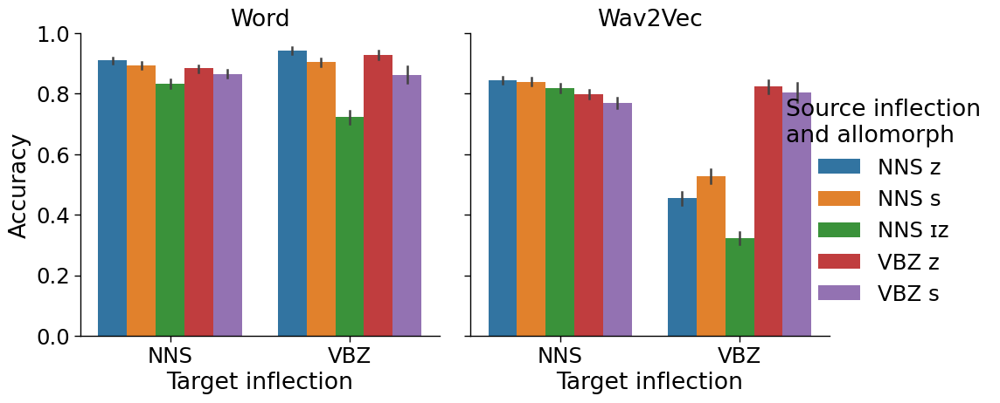

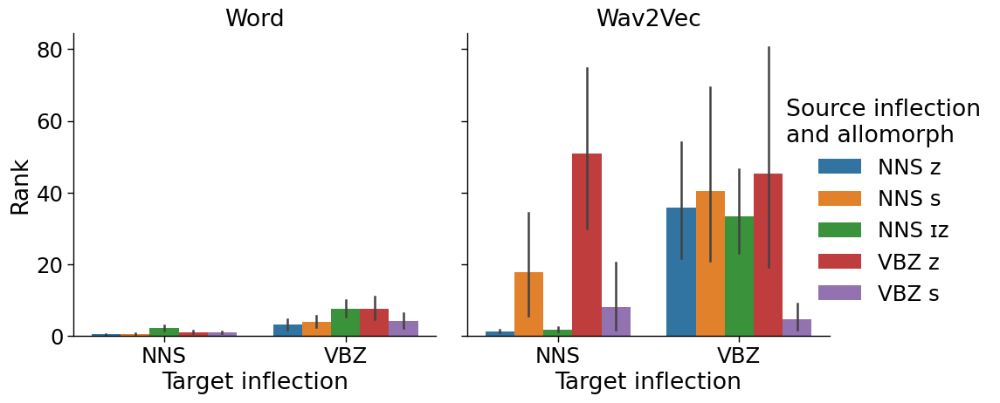

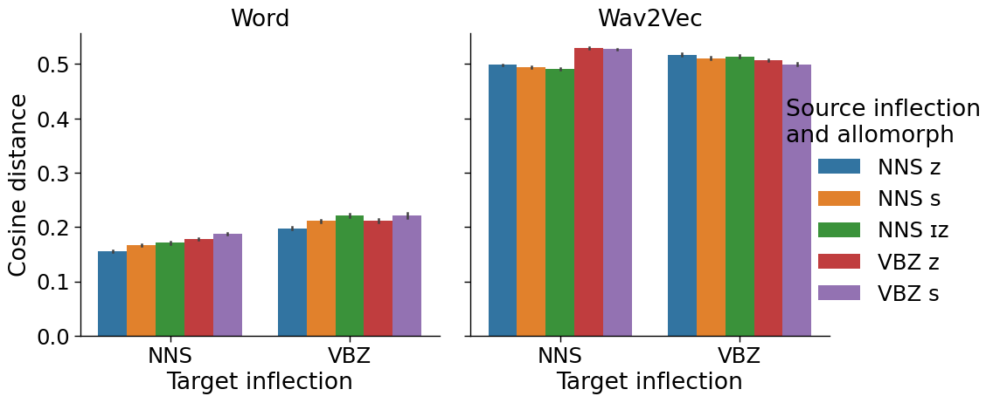

In [27]:
allomorph_plot_data = nnvb_focus.assign(source_label=lambda xs: xs.inflection_from + " " + xs.allomorph_from)
# drop VBZ IH Z, which only has 4 word types
allomorph_plot_data = allomorph_plot_data[
    ~((allomorph_plot_data.inflection_from == "VBZ") & (allomorph_plot_data.allomorph_from == "ɪz")) &
    ~((allomorph_plot_data.inflection_to == "VBZ") & (allomorph_plot_data.allomorph_to == "ɪz"))]

for metric in plot_metrics:
    g = sns.catplot(data=allomorph_plot_data, x="inflection_to", hue="source_label", y=metric, col="model_label", kind="bar")
    g.legend.set_title("Source inflection\nand allomorph")
    
    for ax in g.axes.flat:
        if ax.get_ylabel():
            ax.set_ylabel(plot_metrics_pretty[metric])
        ax.set_title(ax.get_title().split("=")[1].strip())
        ax.set_xlabel("Target inflection")
    
    g.savefig(f"{output_dir}/nnvb_allomorphs_barplot-{metric}.pdf", bbox_inches="tight")

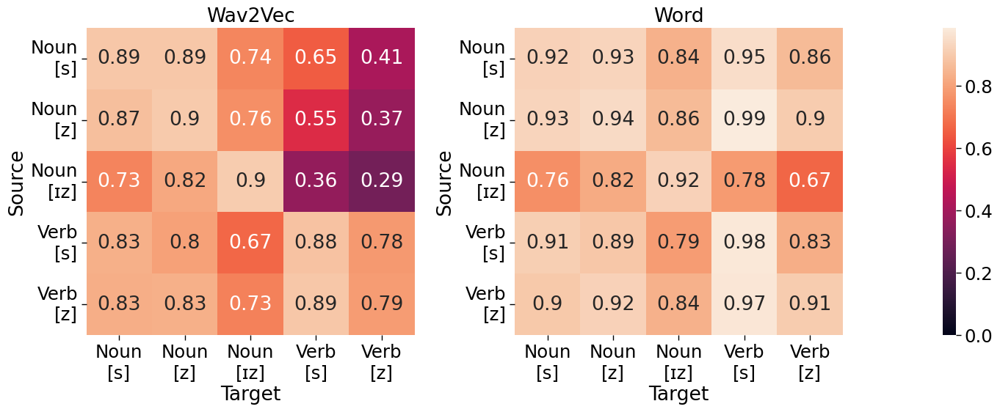

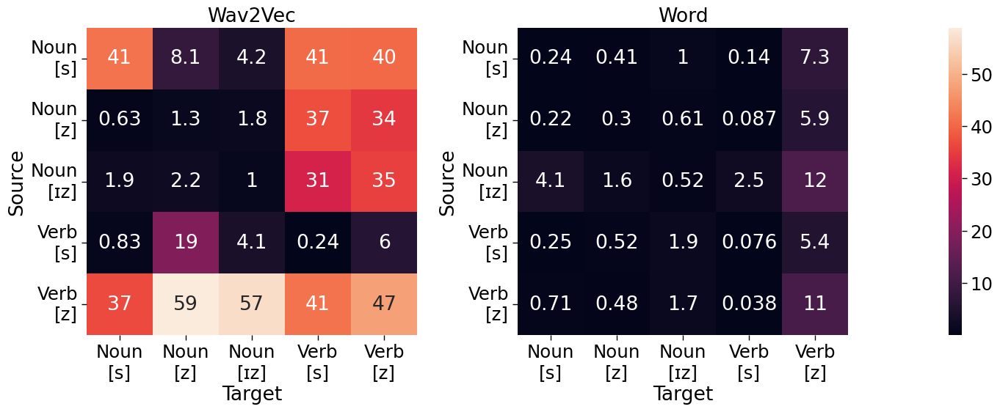

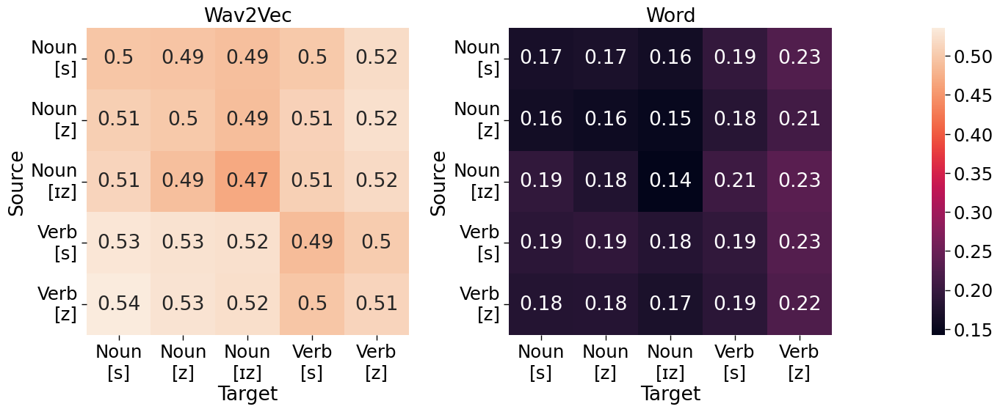

In [28]:
for metric in plot_metrics:
    vmin = 0 if metric == "correct" else nnvb_results_summary[metric].min()
    vmax = nnvb_results_summary[metric].max()

    f, axs = plt.subplots(1, 3, figsize=(7 * 2, 6), gridspec_kw={'width_ratios': [1, 1, 0.04]})
    # f.suptitle(f"{metric}", fontsize=20)
    for i, (ax, (model_label, rows)) in enumerate(zip(axs, nnvb_results_summary.groupby("model_label"))):
        cbar_ax = None
        if i == 1:
            cbar_ax = axs.flat[-1]

        ax.set_title(model_label)
        sns.heatmap(rows.set_index(["source_label", "target_label"]).sort_index()[metric].unstack("target_label"),
                    vmin=vmin, vmax=vmax,
                    annot=True, fmt=".2g", ax=ax,
                    cbar=i == 1, cbar_ax=cbar_ax)

        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("Source")
        ax.set_xlabel("Target")

    f.tight_layout()
    f.savefig(f"{output_dir}/nnvb_allomorphs-{metric}.pdf", bbox_inches="tight")

In [29]:
nnvb_results_summary2 = nnvb_focus.groupby(["model_label", "inflection_from", "inflection_to"]) \
    [plot_metrics].mean().reset_index()

nnvb_results_summary2["transfer_label"] = nnvb_results_summary2.inflection_from + " -> " + nnvb_results_summary2.inflection_to
nnvb_results_summary2

,model_label,inflection_from,inflection_to,correct,gt_label_rank,gt_distance,transfer_label
0,Wav2Vec,NNS,NNS,0.834395,6.710828,0.494455,NNS -> NNS
1,Wav2Vec,NNS,VBZ,0.359575,68.390830,0.522327,NNS -> VBZ
2,Wav2Vec,VBZ,NNS,0.763045,28.605322,0.528969,VBZ -> NNS
3,Wav2Vec,VBZ,VBZ,0.770320,37.387671,0.508559,VBZ -> VBZ
4,Word,NNS,NNS,0.879222,1.002778,0.164584,NNS -> NNS
5,Word,NNS,VBZ,0.782738,10.138095,0.215403,NNS -> VBZ
6,Word,VBZ,NNS,0.821695,2.737392,0.195159,VBZ -> NNS
7,Word,VBZ,VBZ,0.850275,7.935440,0.219984,VBZ -> VBZ


/tmp/ipykernel_1259256/402605089.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  f.tight_layout()
/tmp/ipykernel_1259256/402605089.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  f.tight_layout()
/tmp/ipykernel_1259256/402605089.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  f.tight_layout()


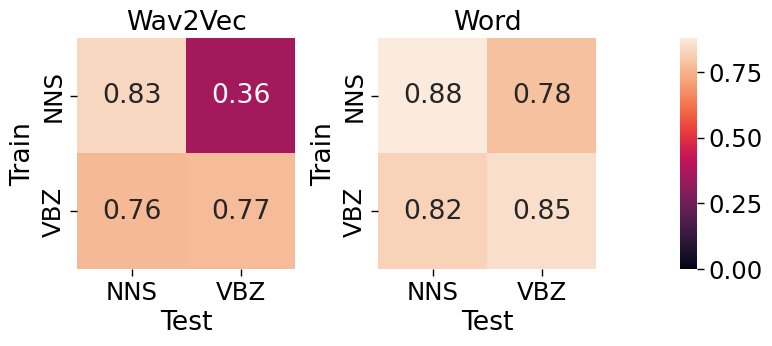

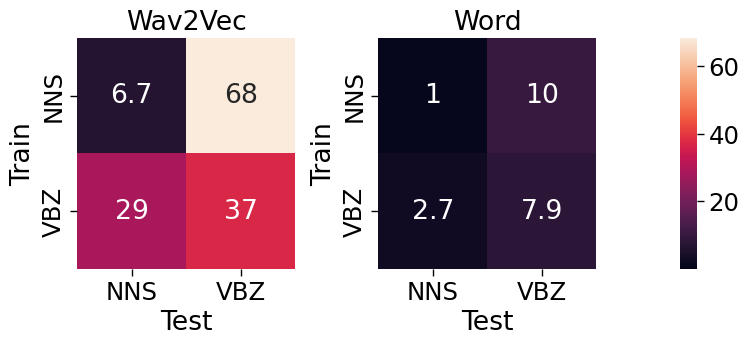

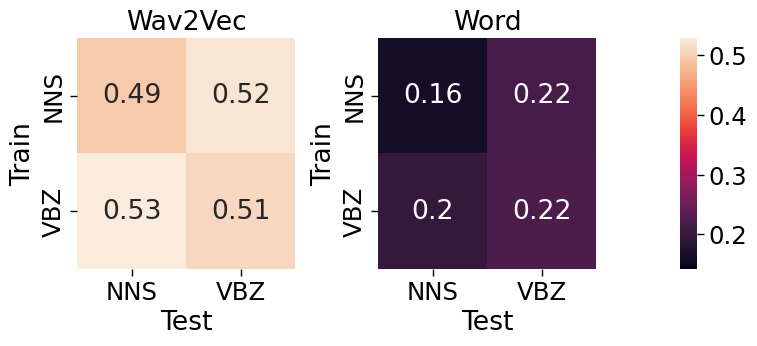

In [30]:
from matplotlib.gridspec import GridSpec


for metric in plot_metrics:
    vmin = 0 if metric == "correct" else nnvb_results_summary[metric].min()
    vmax = nnvb_results_summary2[metric].max()

    f = plt.figure(figsize=(3 * 2 + 2, 3))
    gs = GridSpec(1, 3, width_ratios=[1, 1, 0.08],
                  wspace=0.55)

    axs = [f.add_subplot(gs[0]), f.add_subplot(gs[1])]
    cbar_ax = f.add_subplot(gs[2])

    for i, (ax, (model_label, rows)) in enumerate(zip(axs, nnvb_results_summary2.groupby("model_label"))):
        cbar_ax_i = None
        if i == 1:
            cbar_ax_i = cbar_ax
        
        ax.set_title(model_label)
        sns.heatmap(rows.set_index(["inflection_from", "inflection_to"])[metric].unstack(),
                    annot=True, vmin=vmin, vmax=vmax, ax=ax,
                    cbar=i == 1, cbar_ax=cbar_ax)
        ax.set_xlabel("Test")
        ax.set_ylabel("Train")

    f = plt.gcf()
    f.tight_layout()
    f.savefig(f"{output_dir}/nnvb_results-{metric}.pdf", bbox_inches="tight")

Text(88.28840000000004, 0.5, 'Rank')

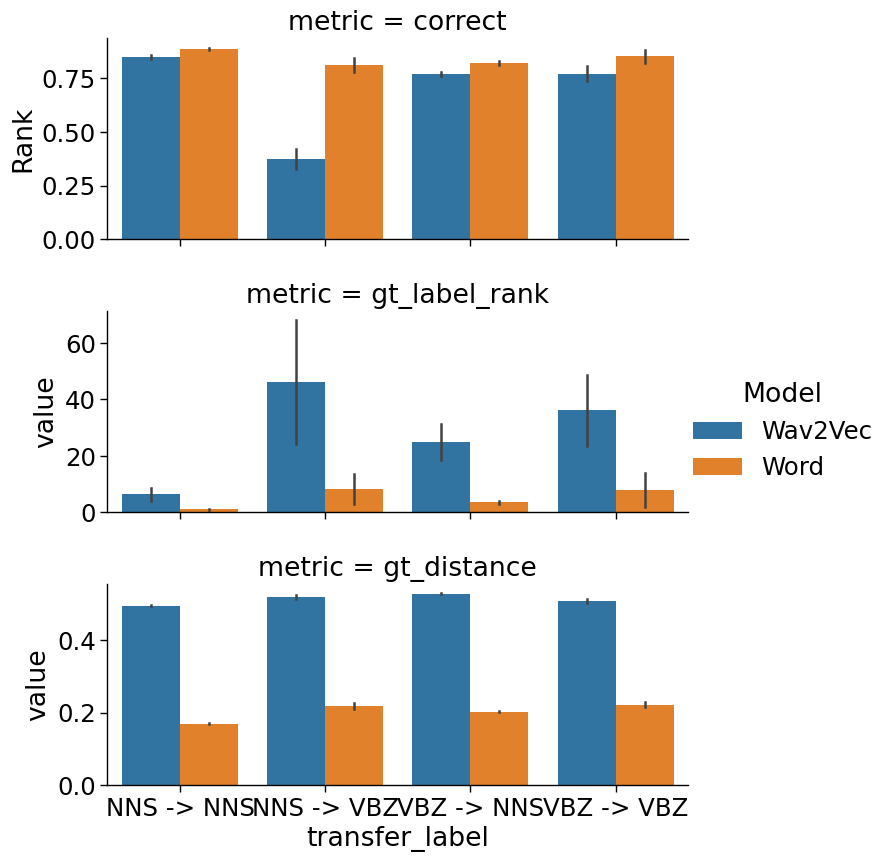

In [31]:
nnvb_plot = nnvb_focus.groupby(["model_label", "inflection_from", "inflection_to", "base_to"])[plot_metrics].mean().reset_index() \
    .melt(id_vars=["model_label", "inflection_from", "inflection_to", "base_to"],
          value_vars=plot_metrics, var_name="metric", value_name="value")
nnvb_plot["transfer_label"] = nnvb_plot.inflection_from + " -> " + nnvb_plot.inflection_to
g = sns.catplot(data=nnvb_plot, x="transfer_label", y="value", kind="bar", hue="model_label", row="metric", sharey="row",
                errorbar="se", height=3, aspect=2.5)
g._legend.set_title("Model")
ax = g.axes.flat[0]

ax.set_xlabel("Evaluation")
ax.set_ylabel("Rank")

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


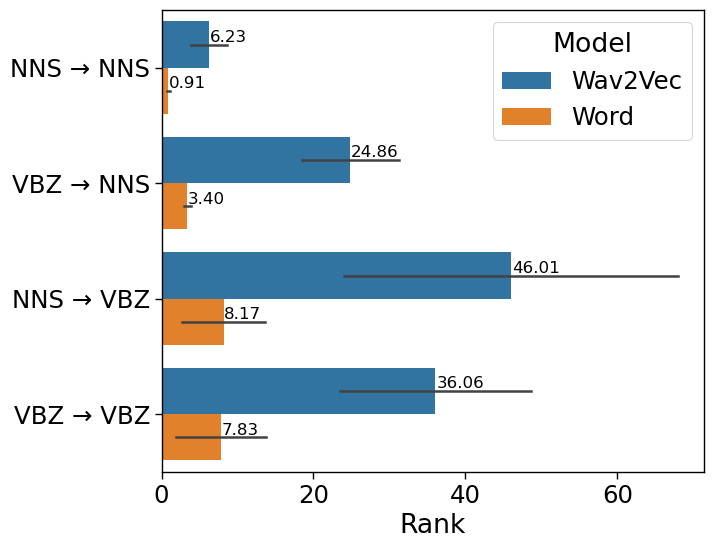

In [33]:
f, ax = plt.subplots(figsize=(7, 6))

transfer_label_pretty = {
    "NNS -> NNS": "NNS → NNS",
    "VBZ -> NNS": "VBZ → NNS",
    "NNS -> VBZ": "NNS → VBZ",
    "VBZ -> VBZ": "VBZ → VBZ",
}
ax = sns.barplot(data=nnvb_plot.set_index(sorted(set(nnvb_plot.columns) - {"value"}))
                    .value.unstack("metric").reset_index()
                    .assign(transfer_label=lambda xs: xs.transfer_label.map(transfer_label_pretty)),
                 x="gt_label_rank", y="transfer_label", hue="model_label",
                 errorbar="se", ax=ax)

# Annotate means
for patch in ax.patches:
    height = patch.get_height()
    width = patch.get_width()
    x = patch.get_x()
    y = patch.get_y()
    if width == 0:
        continue

    # Horizontal bar: label to the right of the bar
    ax.text(x + width + 0.1, y + height / 2.9,
            f"{width:.2f}", fontsize=12,
            va='center', ha='left')

ax.set_ylabel(None)
ax.set_xlabel("Rank")
ax.legend(title="Model")

f.savefig(f"{output_dir}/nnvb_results_barplot-rank.pdf", bbox_inches="tight")

In [34]:
nnvb_plot.set_index(sorted(set(nnvb_plot.columns) - {"value"})).value.unstack("metric").reset_index().assign(transfer_label=lambda xs: xs.transfer_label.map(transfer_label_pretty)) \
    .groupby(["model_label", "transfer_label"]).gt_label_rank.mean()

model_label  transfer_label
Wav2Vec      NNS → NNS          6.229060
             NNS → VBZ         46.012567
             VBZ → NNS         24.858672
             VBZ → VBZ         36.060083
Word         NNS → NNS          0.909708
             NNS → VBZ          8.171183
             VBZ → NNS          3.403545
             VBZ → VBZ          7.828203
Name: gt_label_rank, dtype: float64

### Basic quant analysis

#### Word probe < wav2vec

In [35]:
from scipy.stats import ttest_ind
ttest_ind(nnvb_plot.query("model_label == 'Wav2Vec' and metric == 'gt_label_rank'").value,
          nnvb_plot.query("model_label == 'Word' and metric == 'gt_label_rank'").value)

TtestResult(statistic=4.432158611132147, pvalue=9.641149038705735e-06, df=3216.0)

#### In word probe, nouns are better predicted than verbs on average

In [36]:
from scipy.stats import ttest_ind
ttest_ind(nnvb_plot.query("model_label == 'Word' and inflection_to == 'NNS' and metric == 'gt_label_rank'").value,
          nnvb_plot.query("model_label == 'Word' and inflection_to == 'VBZ' and metric == 'gt_label_rank'").value)

TtestResult(statistic=-4.010920189756696, pvalue=6.325843959495565e-05, df=1607.0)

### Regression analysis

In [37]:
full_formula = "gt_label_rank ~ C(inflection_from, Treatment(reference='NNS')) * C(inflection_to, Treatment(reference='NNS')) * " \
              "C(allomorph_from, Treatment(reference='Z')) * C(allomorph_to, Treatment(reference='Z')) +" \
              "from_freq + to_freq"

In [38]:
def get_interaction_strength(rows):
    rows["correct"] = rows.correct.astype(int)
    
    # we want to exclude rare VBZ+IH Z cases;
    # this would make for an unbalanced regression, so we will simply exclude all IH Z
    # rows = rows.query("not ((inflection_from == 'VBZ' and allomorph_from == 'IH Z') or (inflection_to == 'VBZ' and allomorph_to == 'IH Z'))")
    rows = rows.query("allomorph_from != 'IH Z' and allomorph_to != 'IH Z'")
    
    # standardize frequency
    rows["from_freq"] = (rows.from_freq - rows.from_freq.mean()) / rows.from_freq.std()
    rows["to_freq"] = (rows.to_freq - rows.to_freq.mean()) / rows.to_freq.std()
    
    # fit OLS, remove outliers
    model = ols(full_formula, data=rows[rows.gt_label_rank < np.percentile(rows.gt_label_rank, 99)]).fit()

    results = pd.concat([
        model.params.rename("coef").to_frame(),
        model.conf_int().rename(columns={0: "ci_lower", 1: "ci_upper"})
    ], axis=1).rename_axis("term")
    return results

In [39]:
interaction_model_fits = all_nnvb_results.groupby(run_groupers).apply(get_interaction_strength).reset_index()
interaction_model_fits

/tmp/ipykernel_1259256/580146737.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  interaction_model_fits = all_nnvb_results.groupby(run_groupers).apply(get_interaction_strength).reset_index()


,base_model_name,model_name,equivalence,term,coef,ci_lower,ci_upper
0,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,Intercept,194.249559,159.067642,229.431475
1,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,"C(inflection_from, Treatment(reference='NNS'))...",20.230013,-30.824024,71.284050
2,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,"C(inflection_to, Treatment(reference='NNS'))[T...",65.270751,14.619233,115.922268
3,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,"C(allomorph_from, Treatment(reference='Z'))[T.S]",66.281612,17.006325,115.556898
4,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,"C(allomorph_to, Treatment(reference='Z'))[T.S]",64.758020,15.561420,113.954620
...,...,...,...,...,...,...,...
895,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,"C(inflection_from, Treatment(reference='NNS'))...",-0.013231,-1.050486,1.024024
896,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,"C(inflection_to, Treatment(reference='NNS'))[T...",0.823071,-0.215910,1.862052
897,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,"C(inflection_from, Treatment(reference='NNS'))...",-1.110776,-2.938141,0.716590
898,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,from_freq,-0.352102,-0.459876,-0.244328


In [40]:
interaction_strengths = interaction_model_fits[interaction_model_fits.term.str.contains(":", regex=True)]
interaction_strengths = interaction_strengths.groupby(run_groupers).coef.apply(lambda xs: np.linalg.norm(xs, ord=1)).sort_values()

In [41]:
def clean_term_label(term):
    """
    Clean up statsmodels-style categorical interaction labels.
    """
    # Remove Treatment(...) references
    term = re.sub(r"C\(([^,]+),\s*Treatment\(reference='[^']+'\)\)", r"\1", term)
    
    # Replace [T.X] with =X
    term = re.sub(r"\[T\.([^\]]+)\]", r"=\1", term)

    # Replace colons (:) with × to indicate interaction
    term = term.replace(":", " × ")

    return term

def format_params_as_latex_table(params_df, coef_col="coef", stderr_col=None, round_digits=3):
    """
    Render cleaned statsmodels params as LaTeX table.
    Optionally include standard errors if `stderr_col` is provided.
    """
    df = params_df.copy()
    df.index = df.index.map(clean_term_label)
    
    df = df[[coef_col]] if stderr_col is None else df[[coef_col, stderr_col]]
    df = df.round(round_digits)

    latex = df.to_latex(escape=False, column_format="l" + "r" * df.shape[1])
    return latex

In [42]:
# interaction_model_fits.assign(term=lambda xs: "\\texttt{" + xs.term.map(clean_term_label) + "}",
#                               model_name=lambda xs: xs.model_name.map({"ffff_32": "Word", "id": "Wav2Vec"})) \
#     .query("model_name == 'Word' or model_name == 'Wav2Vec'") \
#     .query("base_model_name == 'w2v2_8'") \
#     .melt(id_vars=["base_model_name", "model_name", "term"],
#           value_vars=["coef", "ci_lower", "ci_upper"],
#           var_name="statistic", value_name="value") \
#     .pivot_table(index="term", columns=["model_name", "statistic"], values="value")

In [43]:
print(interaction_model_fits.assign(term=lambda xs: "\\texttt{" + xs.term.map(clean_term_label) + "}",
                              model_name=lambda xs: xs.model_name.map({"ffff_32": "Word", "id": "Wav2Vec"})) \
    .query("model_name == 'Word' or model_name == 'Wav2Vec'") \
    .query("base_model_name == 'w2v2_8'") \
    .pivot_table(index="term", columns="model_name", values="coef") \
    .to_latex(escape=False, column_format="l" + "r" * 2,
                caption="Full regression model fits for predicting rank outcomes from individual trial properties.",
                label="tbl:regression-results",
                float_format="%.2f",
                index_names=False))

\begin{table}
\caption{Full regression model fits for predicting rank outcomes from individual trial properties.}
\label{tbl:regression-results}
\begin{tabular}{lrr}
\toprule
model_name & Wav2Vec & Word \\
\midrule
\texttt{Intercept} & 0.53 & 0.10 \\
\texttt{allomorph_from=S × allomorph_to=S} & -0.20 & -0.08 \\
\texttt{allomorph_from=S} & -0.06 & 0.06 \\
\texttt{allomorph_to=S} & -0.30 & 0.06 \\
\texttt{from_freq} & -0.38 & -0.04 \\
\texttt{inflection_from=VBZ × allomorph_from=S × allomorph_to=S} & -0.77 & -0.01 \\
\texttt{inflection_from=VBZ × allomorph_from=S} & 0.46 & -0.01 \\
\texttt{inflection_from=VBZ × allomorph_to=S} & 0.87 & -0.03 \\
\texttt{inflection_from=VBZ × inflection_to=VBZ × allomorph_from=S × allomorph_to=S} & 0.46 & -0.31 \\
\texttt{inflection_from=VBZ × inflection_to=VBZ × allomorph_from=S} & 1.41 & 0.25 \\
\texttt{inflection_from=VBZ × inflection_to=VBZ × allomorph_to=S} & -0.71 & 0.07 \\
\texttt{inflection_from=VBZ × inflection_to=VBZ} & -5.17 & -0.13 \\
\texttt{i

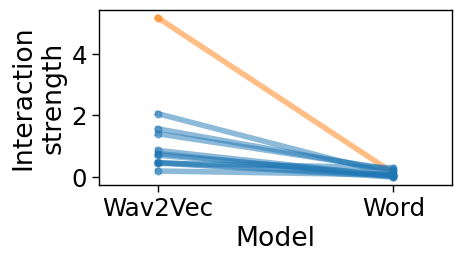

In [48]:
spaghetti_data = interaction_model_fits[interaction_model_fits.model_name.isin(("ffff_32", "id")) &
                                        (interaction_model_fits.base_model_name == "w2v2_8") &
                                        (interaction_model_fits.term.str.contains(":"))] \
    .pivot_table(index="term", columns="model_name", values="coef")
# reorder
assert set(spaghetti_data.columns) == {"ffff_32", "id"}
spaghetti_data = spaghetti_data[["id", "ffff_32"]]
spaghetti_data = np.abs(spaghetti_data).sort_values("id", ascending=False)
spaghetti_data.columns = spaghetti_data.columns.map({"id": "Wav2Vec", main_plot_run[1]: "Word"})

f, ax = plt.subplots(figsize=(5, 3))
for i, (term, row) in enumerate(spaghetti_data.iterrows()):
    color_idx = 0
    if i == 0:
        # plot first line in a different color
        color_idx = 1
    ax.plot(np.arange(len(row)), row, color=sns.color_palette()[color_idx], marker="o", alpha=0.5, linewidth=4)
ax.set_xticks(np.arange(len(row)))
ax.set_xticklabels(spaghetti_data.columns)
ax.set_xlim((-0.25, 1.25))
ax.set_xlabel("Model")
ax.set_ylabel("Interaction\nstrength")

f.tight_layout()
f.savefig(f"{output_dir}/interaction_strength_spaghetti.pdf", bbox_inches="tight")

In [49]:
spaghetti_data.Word > spaghetti_data.Wav2Vec

term
C(inflection_from, Treatment(reference='NNS'))[T.VBZ]:C(inflection_to, Treatment(reference='NNS'))[T.VBZ]                                                                                                    False
C(inflection_to, Treatment(reference='NNS'))[T.VBZ]:C(allomorph_from, Treatment(reference='Z'))[T.S]                                                                                                         False
C(inflection_to, Treatment(reference='NNS'))[T.VBZ]:C(allomorph_to, Treatment(reference='Z'))[T.S]                                                                                                           False
C(inflection_from, Treatment(reference='NNS'))[T.VBZ]:C(inflection_to, Treatment(reference='NNS'))[T.VBZ]:C(allomorph_from, Treatment(reference='Z'))[T.S]                                                   False
C(inflection_from, Treatment(reference='NNS'))[T.VBZ]:C(allomorph_to, Treatment(reference='Z'))[T.S]                                                   

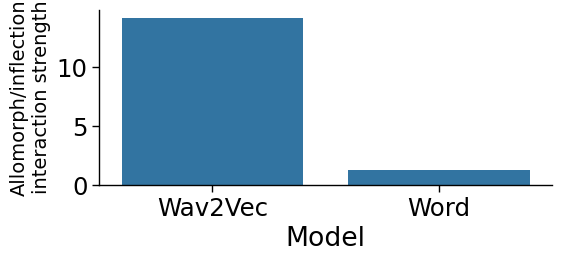

In [51]:
plot_is = interaction_strengths.reindex(plot_runs).reset_index()
plot_is["layer"] = plot_is.base_model_name.str.extract(r"_(\d+)$").astype(int)
plot_is["model_name"] = plot_is["model_name"].map({"id": "Wav2Vec", main_plot_run[1]: "Word"})

g = sns.catplot(data=plot_is[plot_is.layer == 8],
                x="model_name", y="coef", order=["Wav2Vec", "Word"],
                kind="bar", height=3, aspect=2)
g.axes.flat[0].set_ylabel("Allomorph/inflection\ninteraction strength", fontsize=14)
g.axes.flat[0].set_xlabel("Model")

g.tight_layout()
g.savefig(f"{output_dir}/interaction_strength.pdf", bbox_inches="tight")

### Correct for verb paradigm size

In [52]:
# study_df = nnvb_focus[(nnvb_focus.inflection_to == "VBZ")].copy()

In [53]:
# study_df["predicted_stem"] = study_df.predicted_label.str.replace(r"s$|ed$|ings?$", "", regex=True)
# study_df["base_to_stem"] = study_df.base_to.str.replace(r"e$", "", regex=True).replace(r"y$", "i", regex=True)
# study_df["predicted_within_inflection"] = \
#     (study_df.predicted_stem == study_df.base_to) | (study_df.predicted_stem == study_df.base_to_stem)
# vb_irregulars = [("do", "did"), ("do", "does"), ("begin", "began"), ("learn", "learnt"), ("send", "sent"), ("shine", "shone"), ("seem", "seem'd"), ("read", "red"),
#                  ("possess", "possesses"), ("bring", "brings"), ("carry", "carries"), ("occur", "occurred"), ("think", "thinkest"), ("grow", "grew"),
#                  ("put", "putting"), ("begin", "beginning"), ("give", "givest"),
#                  # homophones
#                  ("allow", "aloud"), ("write", "rights"), ("write", "wright's"), ("depend", "dependent")]
# for base, predicted in vb_irregulars:
#     study_df.loc[study_df.base_to == base, "predicted_within_inflection"] |= study_df.loc[study_df.base_to == base].predicted_label == predicted

In [54]:
# merge_keys = ["experiment", "equivalence", "model_label", "model_name", "base_model_name", "group", "inflection_from", "inflection_to", "base_from", "inflected_from", "base_to", "inflected_to"]
# nnvb_focus = pd.merge(nnvb_focus.reset_index(), study_df.reset_index()[merge_keys + ["predicted_within_inflection"]],
#          on=merge_keys, how="left")

In [55]:
# nnvb_focus["correct_or_predicted_within_inflection"] = nnvb_focus.correct | nnvb_focus.predicted_within_inflection

In [56]:
# nnvb_results_summary2 = nnvb_focus.groupby(["model_label", "inflection_from", "inflection_to"]) \
#     [["correct_or_predicted_within_inflection", "correct", "gt_label_rank", "gt_distance"]].mean().reset_index()

# nnvb_results_summary2["transfer_label"] = nnvb_results_summary2.inflection_from + " -> " + nnvb_results_summary2.inflection_to
# nnvb_results_summary2

In [57]:
# f, axs = plt.subplots(1, 3, figsize=(4 * 2, 3), gridspec_kw={'width_ratios': [1, 1, 0.04]})

# vmin = 0
# vmax = nnvb_results_summary2.correct_or_predicted_within_inflection.max()

# for i, (ax, (model_label, rows)) in enumerate(zip(axs, nnvb_results_summary2.groupby("model_label"))):
#     cbar_ax = None
#     if i == 1:
#         cbar_ax = axs.flat[-1]
    
#     ax.set_title(model_label)
#     sns.heatmap(rows.set_index(["inflection_from", "inflection_to"]).correct_or_predicted_within_inflection.unstack(),
#                 vmin=vmin, vmax=vmax,
#                 annot=True, ax=ax, cbar=i == 1, cbar_ax=cbar_ax)
#     ax.set_xlabel("Test")
#     ax.set_ylabel("Train")

# f = plt.gcf()
# f.tight_layout()
# f.savefig(f"{output_dir}/nnvb_results-correct_inflection.pdf")

In [58]:
# nnvb_plot = nnvb_focus.groupby(["model_label", "inflection_from", "inflection_to", "base_to"]).correct_or_predicted_within_inflection.mean().reset_index()
# nnvb_plot["transfer_label"] = nnvb_plot.inflection_from + " -> " + nnvb_plot.inflection_to
# order = ["NNS -> VBZ", "VBZ -> VBZ", "VBZ -> NNS", "NNS -> NNS"]
# g = sns.catplot(data=nnvb_plot, x="transfer_label", y="correct_or_predicted_within_inflection", kind="bar", hue="model_label", order=order, errorbar="se", height=4, aspect=2)
# g._legend.set_title("Model")
# ax = g.axes.flat[0]

# ax.set_xlabel("Evaluation")
# ax.set_ylabel("Accuracy")

### Frequency analysis

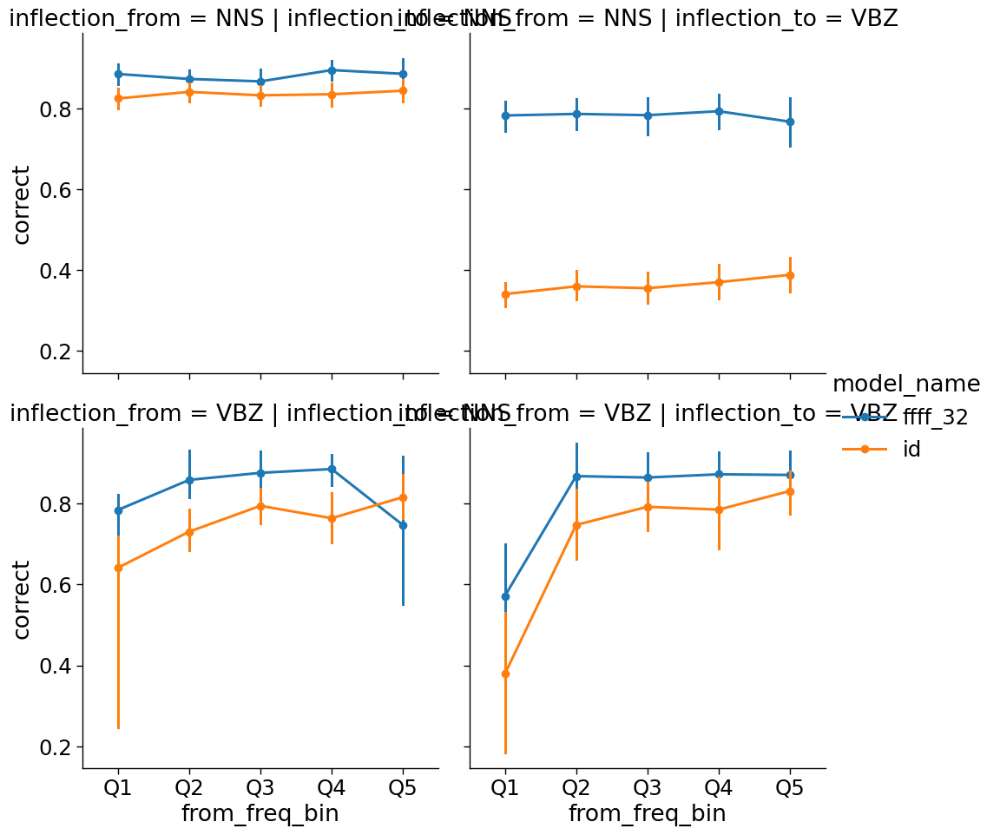

In [59]:
sns.catplot(data=nnvb_focus.reset_index(),
            x="from_freq_bin", y="correct", hue="model_name",
            row="inflection_from", col="inflection_to", units="base_from", kind="point")

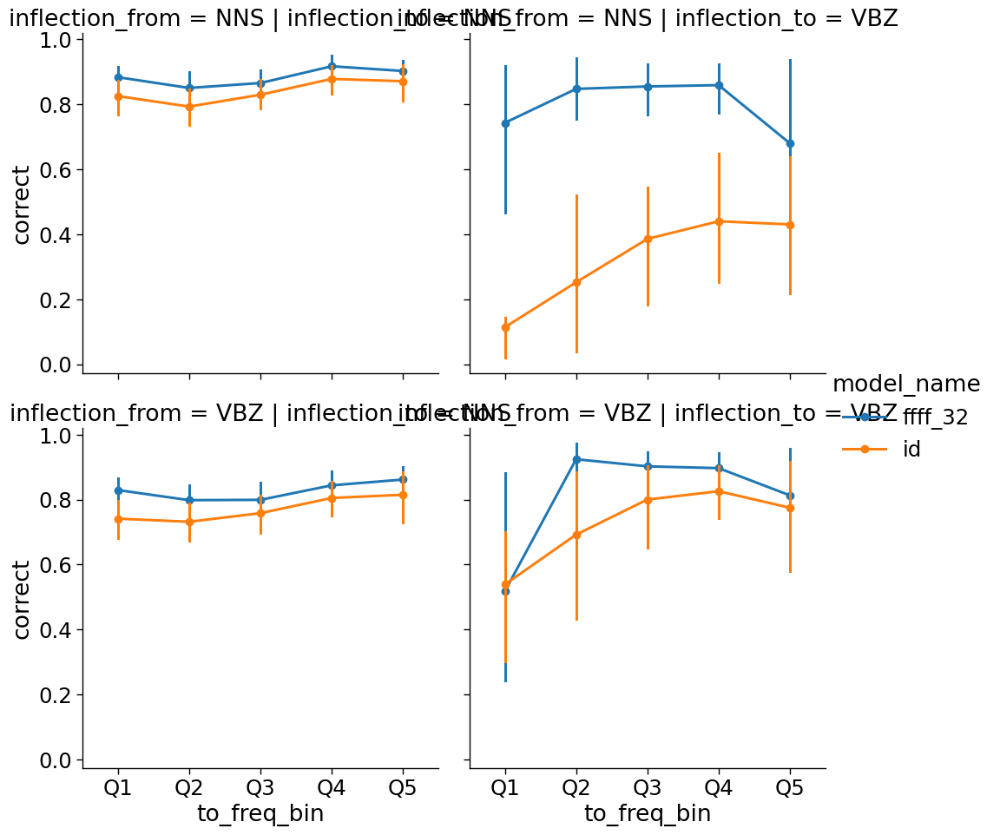

In [60]:
sns.catplot(data=nnvb_focus.reset_index(),
            x="to_freq_bin", y="correct", hue="model_name",
            row="inflection_from", col="inflection_to", units="base_to", kind="point")

#### On rank

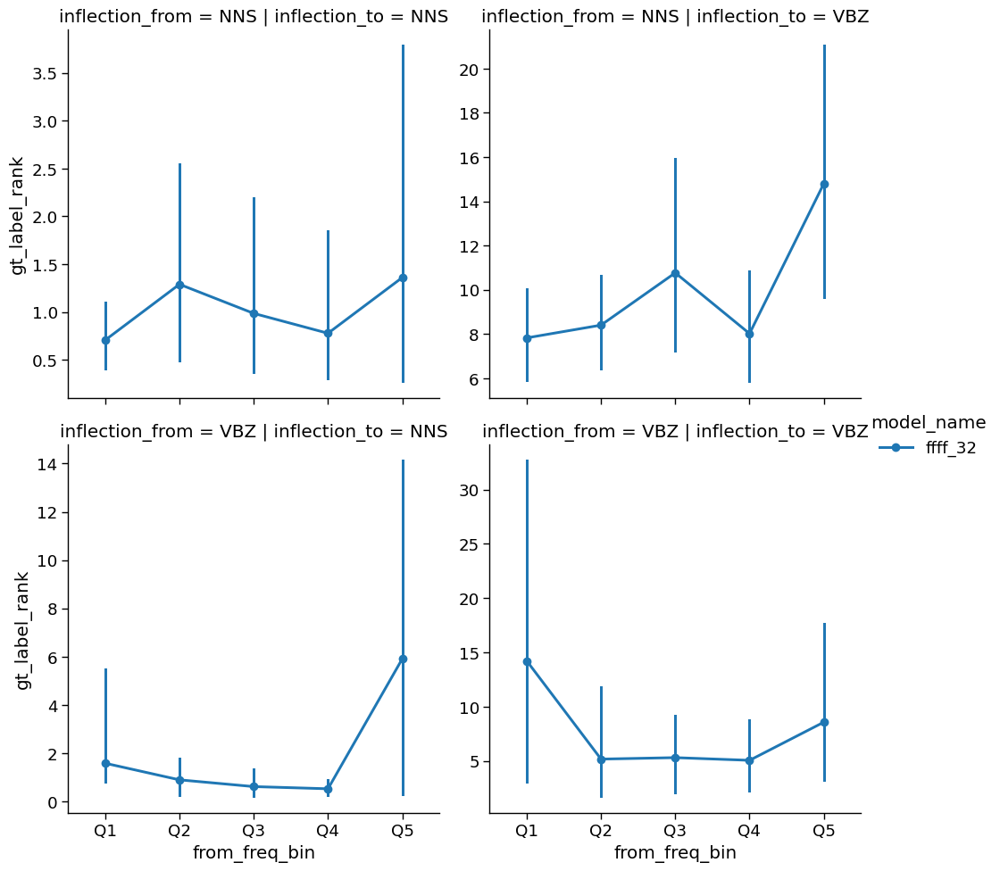

In [ ]:
sns.catplot(data=nnvb_focus.reset_index().query("model_name == @focus_model"),
            x="from_freq_bin", y="gt_label_rank", hue="model_name",
            row="inflection_from", col="inflection_to",
            units="base_from", kind="point",
            sharey=False)

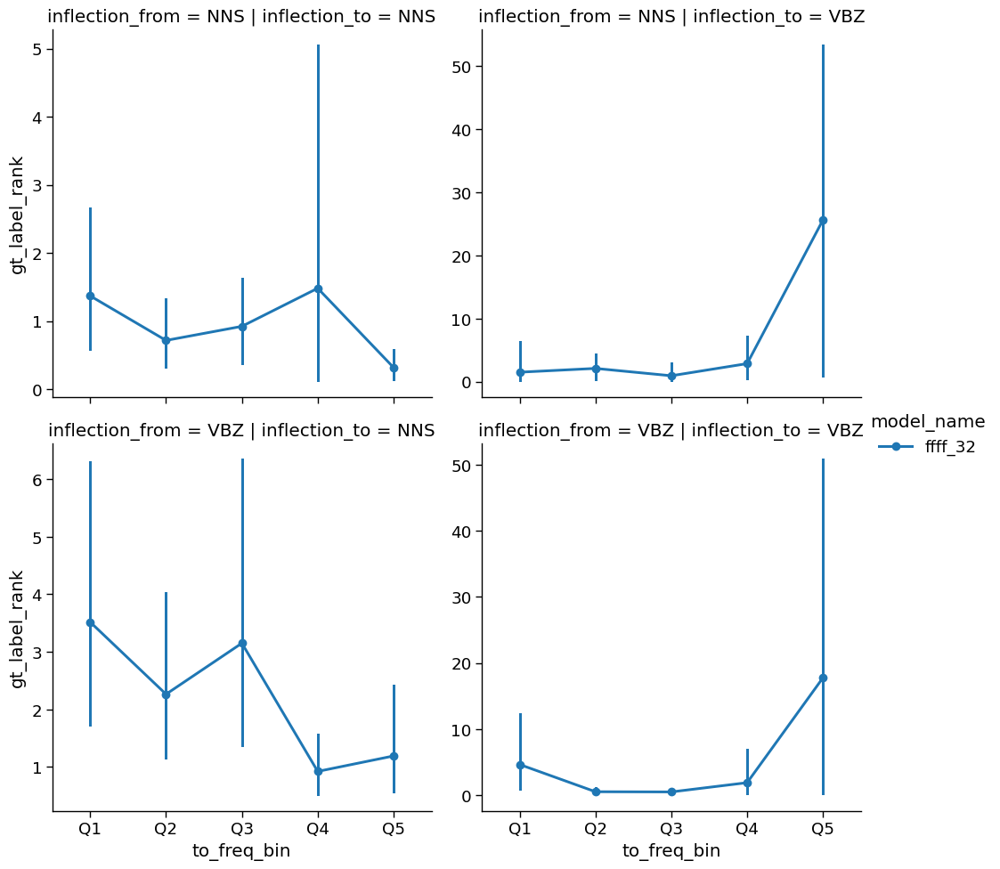

In [ ]:
sns.catplot(data=nnvb_focus.reset_index().query("model_name == @focus_model"),
            x="to_freq_bin", y="gt_label_rank", hue="model_name",
            row="inflection_from", col="inflection_to",
            sharey=False,
            units="base_to", kind="point")

## Controlled VBD analysis

In [61]:
all_vbd_results = all_results.query("experiment == 'regular' and inflection_from == 'VBD'")
all_vbd_results = pd.merge(all_vbd_results, most_common_allomorphs.rename(columns={"base": "base_from", "inflection": "inflection_from", "most_common_allomorph": "allomorph_from"}),
               on=["base_from", "inflection_from"], how="left")
all_vbd_results = pd.merge(all_vbd_results, most_common_allomorphs.rename(columns={"base": "base_to", "inflection": "inflection_to", "most_common_allomorph": "allomorph_to"}),
               on=["base_to", "inflection_to"], how="left")
all_vbd_results[["allomorph_from", "allomorph_to"]].value_counts()

allomorph_from  allomorph_to
D               D               12212
T               D                5240
D               IH D             5121
                T                5090
IH D            D                5071
                                ...  
IY G AE N       EY V                1
                EY M                1
                EH T                1
                EH L D              1
EH L T          AW N D              1
Name: count, Length: 1120, dtype: int64

In [62]:
# drop do -> did; how did these irregulars get in here?
exclude_vbd_base = ["do", "hide", "make"]
# exclude stress shift items; we don't know which token items have which stress
exclude_vbd_base += "record permit protest reject subject conduct contract conflict increase decrease contest insult impact address escort".split()
# multiple possible
exclude_vbd_base += "dream leap".split()
all_vbd_results = all_vbd_results[~all_vbd_results.base_from.isin(exclude_vbd_base) & ~all_vbd_results.base_to.isin(exclude_vbd_base)]

In [63]:
keep_vbd_allomorphs = all_vbd_results.allomorph_from.value_counts().head(3).index
all_vbd_results = all_vbd_results[all_vbd_results.allomorph_from.isin(keep_vbd_allomorphs)
                                  & all_vbd_results.allomorph_to.isin(keep_vbd_allomorphs)]

In [64]:
# Add frequency information

all_vbd_results["inflected_from"] = all_vbd_results.from_equiv_label.apply(lambda x: eval(x)[1])
all_vbd_results["inflected_to"] = all_vbd_results.to_equiv_label.apply(lambda x: eval(x)[1])

all_vbd_results = pd.merge(all_vbd_results, word_freq_df["LogFreq"].rename("from_base_freq"),
                           left_on="base_from", right_index=True)
all_vbd_results = pd.merge(all_vbd_results, word_freq_df["LogFreq"].rename("to_base_freq"),
                           left_on="base_to", right_index=True)
all_vbd_results = pd.merge(all_vbd_results, word_freq_df["LogFreq"].rename("from_inflected_freq"),
                            left_on="inflected_from", right_index=True)
all_vbd_results = pd.merge(all_vbd_results, word_freq_df["LogFreq"].rename("to_inflected_freq"),
                            left_on="inflected_to", right_index=True)

all_vbd_results["from_freq"] = all_vbd_results[["from_base_freq", "from_inflected_freq"]].mean(axis=1)
all_vbd_results["to_freq"] = all_vbd_results[["to_base_freq", "to_inflected_freq"]].mean(axis=1)

_, vbd_frequency_bins = pd.qcut(pd.concat([all_vbd_results.to_freq, all_vbd_results.from_freq]), q=3, retbins=True)
all_vbd_results["from_freq_bin"] = pd.cut(all_vbd_results.from_freq, bins=vbd_frequency_bins, labels=[f"Q{i}" for i in range(1, 4)])
all_vbd_results["to_freq_bin"] = pd.cut(all_vbd_results.to_freq, bins=vbd_frequency_bins, labels=[f"Q{i}" for i in range(1, 4)])

In [65]:
def summarize_vbd_run(rows):
    rows["source_label"] = rows.inflection_from + " " + rows.allomorph_from
    rows["target_label"] = rows.inflection_to + " " + rows.allomorph_to

    rows["transfer_label"] = rows.inflection_from + " -> " + rows.inflection_to
    rows["phon_label"] = rows.allomorph_from + " -> " + rows.allomorph_to

    return rows

summary_groupers = ["inflection_from", "inflection_to", "allomorph_from", "allomorph_to"]
vbd_results_summary = all_vbd_results.groupby(run_groupers + summary_groupers) \
    [plot_metrics].mean() \
    .reset_index(summary_groupers) \
    .groupby(run_groupers, group_keys=False) \
    .apply(summarize_vbd_run) \
    .reset_index()

vbd_results_summary

,base_model_name,model_name,equivalence,inflection_from,inflection_to,allomorph_from,allomorph_to,correct,gt_label_rank,gt_distance,source_label,target_label,transfer_label,phon_label
0,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,VBD,VBD,D,D,0.089362,306.208511,0.357088,VBD D,VBD D,VBD -> VBD,D -> D
1,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,VBD,VBD,D,IH D,0.031579,622.084211,0.371437,VBD D,VBD IH D,VBD -> VBD,D -> IH D
2,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,VBD,VBD,D,T,0.082474,232.278351,0.358383,VBD D,VBD T,VBD -> VBD,D -> T
3,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,VBD,VBD,IH D,D,0.074468,353.159574,0.340997,VBD IH D,VBD D,VBD -> VBD,IH D -> D
4,w2v2_0,discrim-ff_32,word_broad_10frames_fixedlen25,VBD,VBD,IH D,IH D,0.060606,135.818182,0.333413,VBD IH D,VBD IH D,VBD -> VBD,IH D -> IH D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBD,VBD,IH D,IH D,0.545455,3.636364,1.030057,VBD IH D,VBD IH D,VBD -> VBD,IH D -> IH D
446,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBD,VBD,IH D,T,0.594595,6.081081,0.950876,VBD IH D,VBD T,VBD -> VBD,IH D -> T
447,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBD,VBD,T,D,0.600000,3.900000,0.933878,VBD T,VBD D,VBD -> VBD,T -> D
448,w2v2_pc_8,discrim-rnn_32-pc-mAP1,word_broad_10frames_fixedlen25,VBD,VBD,T,IH D,0.406250,4.625000,0.950576,VBD T,VBD IH D,VBD -> VBD,T -> IH D


In [66]:
# plot_results = []
# for base_model_name, model_name, equivalence in plot_runs:
#     results_i = vbd_results_summary.query("base_model_name == @base_model_name and model_name == @model_name and equivalence == @equivalence")
#     if len(results_i) > 0:
#         plot_results.append(results_i)
# num_plot_runs = len(plot_results)

# ncols = 4
# nrows = int(np.ceil(num_plot_runs / ncols))
# f, axs = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))

# for ax, results_i in zip(axs.flat, plot_results):
#     sns.heatmap(results_i.set_index(["source_label", "target_label"]).correct.unstack(),
#                 vmin=0, vmax=1, ax=ax)
#     key_row = results_i.iloc[0]
#     ax.set_title(f"{key_row.base_model_name} -> {key_row.model_name} ({key_row.equivalence})")

In [67]:
vbd_focus = all_vbd_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")
vbd_foil = all_vbd_results.query("base_model_name == @foil_base_model and model_name == @foil_model and equivalence == @foil_equivalence")
vbd_focus["model_label"] = "Word"
vbd_foil["model_label"] = "Wav2Vec"
vbd_focus = pd.concat([vbd_focus, vbd_foil])

vbd_results_summary2 = vbd_focus.groupby(["model_label", "inflection_from", "inflection_to"]) \
    [plot_metrics].mean().reset_index()

vbd_results_summary2["transfer_label"] = vbd_results_summary2.inflection_from + " -> " + vbd_results_summary2.inflection_to
vbd_results_summary2

/tmp/ipykernel_1259256/3386417737.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vbd_focus["model_label"] = "Word"
/tmp/ipykernel_1259256/3386417737.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vbd_foil["model_label"] = "Wav2Vec"


,model_label,inflection_from,inflection_to,correct,gt_label_rank,gt_distance,transfer_label
0,Wav2Vec,VBD,VBD,0.750767,6.054448,0.528262,VBD -> VBD
1,Word,VBD,VBD,0.830667,2.385333,0.215118,VBD -> VBD


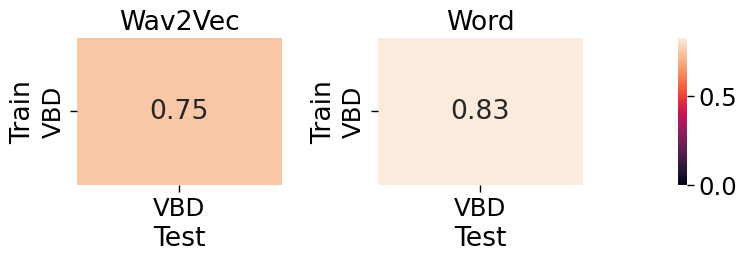

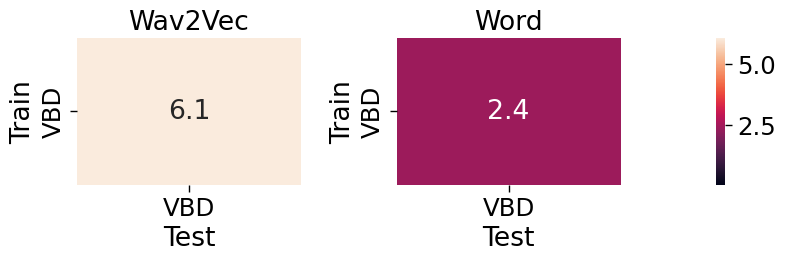

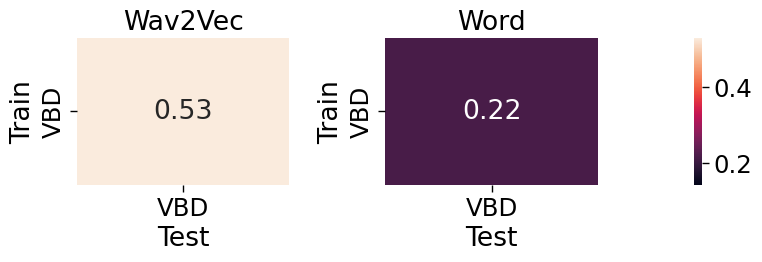

In [68]:
for metric in plot_metrics:
    vmin = 0 if metric == "correct" else nnvb_results_summary[metric].min()
    vmax = vbd_results_summary2[metric].max()

    f, axs = plt.subplots(1, 3, figsize=(4 * 2, 3), gridspec_kw={'width_ratios': [1, 1, 0.04]})

    for i, (ax, (model_label, rows)) in enumerate(zip(axs, vbd_results_summary2.groupby("model_label"))):
        cbar_ax = None
        if i == 1:
            cbar_ax = axs.flat[-1]
        
        ax.set_title(model_label)
        sns.heatmap(rows.set_index(["inflection_from", "inflection_to"])[metric].unstack(),
                    annot=True, vmin=vmin, vmax=vmax, ax=ax,
                    cbar=i == 1, cbar_ax=cbar_ax)
        ax.set_xlabel("Test")
        ax.set_ylabel("Train")

    f = plt.gcf()
    f.tight_layout()
    f.savefig(f"{output_dir}/vbd_results-{metric}.pdf")

### Focused plots

In [69]:
focus_base_model, focus_model, focus_equivalence = main_plot_run
foil_base_model, foil_model, foil_equivalence = "w2v2_8", "id", "id"

vbd_focus = all_vbd_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")
vbd_foil = all_vbd_results.query("base_model_name == @foil_base_model and model_name == @foil_model and equivalence == @foil_equivalence")
vbd_focus["model_label"] = "Word"
vbd_foil["model_label"] = "Wav2Vec"

vbd_focus = pd.concat([vbd_focus, vbd_foil])

allomorph_labels = {"D": "d", "T": "t", "IH D": "ɪd"}
vbd_focus["allomorph_from"] = vbd_focus.allomorph_from.map(allomorph_labels)
vbd_focus["allomorph_to"] = vbd_focus.allomorph_to.map(allomorph_labels)
vbd_focus

/tmp/ipykernel_1259256/2170661113.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vbd_focus["model_label"] = "Word"
/tmp/ipykernel_1259256/2170661113.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vbd_foil["model_label"] = "Wav2Vec"


,index,test_dataset,equivalence,model_name,base_model_name,experiment,Unnamed: 1,group,from_equiv_label,to_equiv_label,...,inflected_to,from_base_freq,to_base_freq,from_inflected_freq,to_inflected_freq,from_freq,to_freq,from_freq_bin,to_freq_bin,model_label
6304,332500,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,regular,2170,"(VBD, False)","('lead', 'led')","('dwell', 'dwelt')",...,dwelt,3.769585,2.232318,3.578256,1.282249,3.673921,1.757284,Q3,Q1,Word
6412,332608,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,regular,2278,"(VBD, False)","('have', 'had')","('build', 'built')",...,built,5.247426,3.513097,4.879203,3.444056,5.063315,3.478577,Q3,Q3,Word
6570,332766,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,regular,2436,"(VBD, False)","('bend', 'bent')","('send', 'sent')",...,sent,2.648001,3.738118,2.496198,3.667339,2.572099,3.702729,Q2,Q3,Word
6939,333135,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,regular,2805,"(VBD, False)","('light', 'lit')","('have', 'had')",...,had,3.825009,5.247426,2.737929,4.879203,3.281469,5.063315,Q3,Q3,Word
7000,333196,librispeech-train-clean-100,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,regular,2866,"(VBD, True)","('reckon', 'reckoned')","('envy', 'envied')",...,envied,1.875196,2.452339,1.650708,1.326607,1.762952,1.889473,Q1,Q1,Word
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89637,4640487,librispeech-train-clean-100,id,id,w2v2_8,regular,3861,"(VBD, True)","('hope', 'hoped')","('assure', 'assured')",...,assured,4.299479,2.393372,2.902086,2.607424,3.600782,2.500398,Q3,Q2,Wav2Vec
89638,4640488,librispeech-train-clean-100,id,id,w2v2_8,regular,3862,"(VBD, True)","('establish', 'established')","('smoke', 'smoked')",...,smoked,2.723676,3.192087,3.005068,2.693423,2.864372,2.942755,Q2,Q2,Wav2Vec
89639,4640489,librispeech-train-clean-100,id,id,w2v2_8,regular,3863,"(VBD, True)","('neglect', 'neglected')","('exceed', 'exceeded')",...,exceeded,2.391758,2.289121,2.375635,2.230652,2.383697,2.259887,Q2,Q1,Wav2Vec
89640,4640490,librispeech-train-clean-100,id,id,w2v2_8,regular,3864,"(VBD, True)","('include', 'included')","('experience', 'experienced')",...,experienced,3.649665,3.842482,3.465604,3.095561,3.557635,3.469021,Q3,Q3,Wav2Vec


In [70]:
vbd_focus.query("inflection_to == 'VBD' and allomorph_to == 'ɪd'").groupby(["model_name", "base_to"]).gt_label_rank.mean().sort_values().tail(20)

model_name  base_to
ffff_32     tend        10.500000
            comfort     12.000000
id          head        13.000000
ffff_32     defeat      14.500000
id          faint       14.666667
            arrest      15.000000
            strut       16.000000
ffff_32     effect      18.000000
id          part        18.000000
            light       19.000000
ffff_32     light       20.000000
id          boast       23.000000
            mind        23.500000
            sight       34.000000
            tend        39.500000
ffff_32     assault     43.000000
id          assent      65.000000
ffff_32     side        90.500000
id          assault     96.000000
            side       229.500000
Name: gt_label_rank, dtype: float64

In [71]:
vbd_focus.query("inflection_to == 'VBD' and allomorph_to == 't'").groupby(["model_name", "base_to"]).gt_label_rank.mean().sort_values().tail(20)

model_name  base_to
ffff_32     shriek        1.500000
id          perish        1.500000
ffff_32     build         2.000000
            grip          2.000000
            trace         2.000000
id          build         2.000000
            snap          2.200000
            place         3.000000
            hop           3.000000
            worship       3.000000
ffff_32     balance       5.500000
id          miss          6.000000
            menace        7.000000
            face          7.000000
ffff_32     march         9.666667
id          deck         12.500000
ffff_32     match        15.500000
id          link         18.000000
            pace         18.000000
            tap        2385.000000
Name: gt_label_rank, dtype: float64

In [72]:
vbd_focus.query("inflection_to == 'VBD' and allomorph_to == 'd'").groupby(["model_name", "base_to"]).gt_label_rank.mean().sort_values()

model_name  base_to   
id          capture         0.0
            consider        0.0
            conjecture      0.0
            confine         0.0
            concern         0.0
                          ...  
ffff_32     row            81.0
id          decree         88.0
ffff_32     nose          411.0
id          row           619.0
            lead          920.0
Name: gt_label_rank, Length: 546, dtype: float64

In [73]:
vbd_results_summary = vbd_focus.groupby(["model_label", "inflection_from", "inflection_to",
                                             "allomorph_from", "allomorph_to"]) \
    [plot_metrics].mean() \
    .reset_index()

vbd_results_summary["source_label"] = vbd_results_summary.inflection_from + "\n" + vbd_results_summary.allomorph_from
vbd_results_summary["target_label"] = vbd_results_summary.inflection_to + "\n" + vbd_results_summary.allomorph_to

vbd_results_summary["transfer_label"] = vbd_results_summary.inflection_from + " -> " + vbd_results_summary.inflection_to
vbd_results_summary["phon_label"] = vbd_results_summary.allomorph_from + " " + vbd_results_summary.allomorph_to

# only retain cases where we have data in both transfer directions from source <-> target within inflection
vbd_results_summary["complement_exists"] = vbd_results_summary.apply(lambda row: len(vbd_results_summary.query("source_label == @row.target_label and target_label == @row.source_label")), axis=1)
vbd_results_summary = vbd_results_summary.query("complement_exists > 0").drop(columns=["complement_exists"])

vbd_results_summary

,model_label,inflection_from,inflection_to,allomorph_from,allomorph_to,correct,gt_label_rank,gt_distance,source_label,target_label,transfer_label,phon_label
0,Wav2Vec,VBD,VBD,d,d,0.758748,5.740331,0.531440,VBD\nd,VBD\nd,VBD -> VBD,d d
1,Wav2Vec,VBD,VBD,d,t,0.807487,13.802139,0.535338,VBD\nd,VBD\nt,VBD -> VBD,d t
2,Wav2Vec,VBD,VBD,d,ɪd,0.628319,8.486726,0.539174,VBD\nd,VBD\nɪd,VBD -> VBD,d ɪd
3,Wav2Vec,VBD,VBD,t,d,0.800000,3.568421,0.517415,VBD\nt,VBD\nd,VBD -> VBD,t d
4,Wav2Vec,VBD,VBD,t,t,0.893617,0.276596,0.515004,VBD\nt,VBD\nt,VBD -> VBD,t t
5,Wav2Vec,VBD,VBD,t,ɪd,0.540541,5.243243,0.546639,VBD\nt,VBD\nɪd,VBD -> VBD,t ɪd
6,Wav2Vec,VBD,VBD,ɪd,d,0.678571,2.205357,0.520909,VBD\nɪd,VBD\nd,VBD -> VBD,ɪd d
7,Wav2Vec,VBD,VBD,ɪd,t,0.642857,1.476190,0.521753,VBD\nɪd,VBD\nt,VBD -> VBD,ɪd t
8,Wav2Vec,VBD,VBD,ɪd,ɪd,0.848485,1.333333,0.492485,VBD\nɪd,VBD\nɪd,VBD -> VBD,ɪd ɪd
9,Word,VBD,VBD,d,d,0.863830,2.225532,0.212450,VBD\nd,VBD\nd,VBD -> VBD,d d


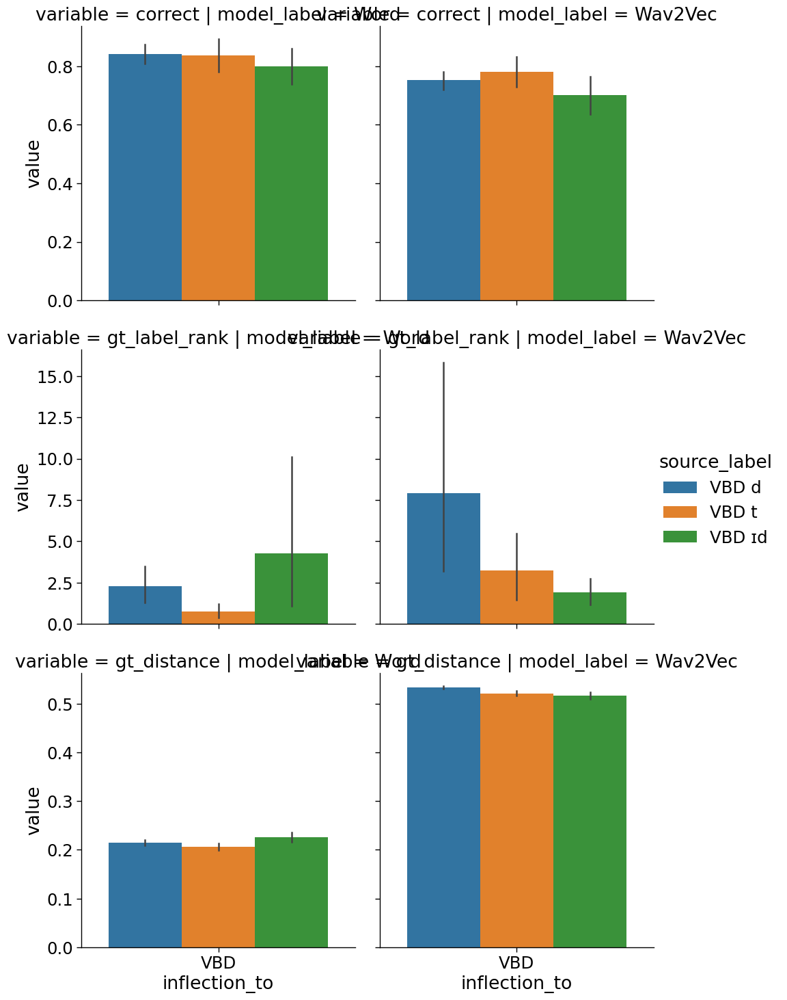

In [74]:
sns.catplot(data=vbd_focus.melt(id_vars=["inflection_from", "allomorph_from", "inflection_to", "model_label"], value_vars=plot_metrics)
                        .assign(source_label=lambda xs: xs.inflection_from + " " + xs.allomorph_from),
                x="inflection_to", hue="source_label", y="value", col="model_label", row="variable", kind="bar", sharey="row")

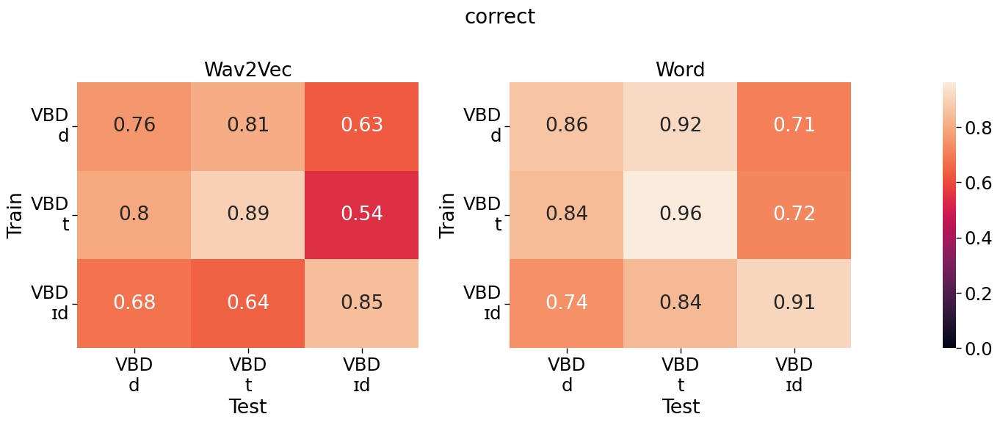

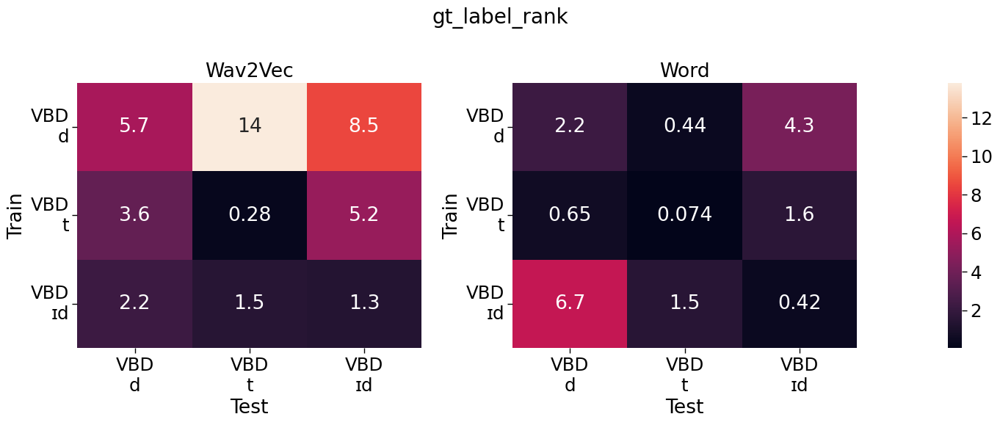

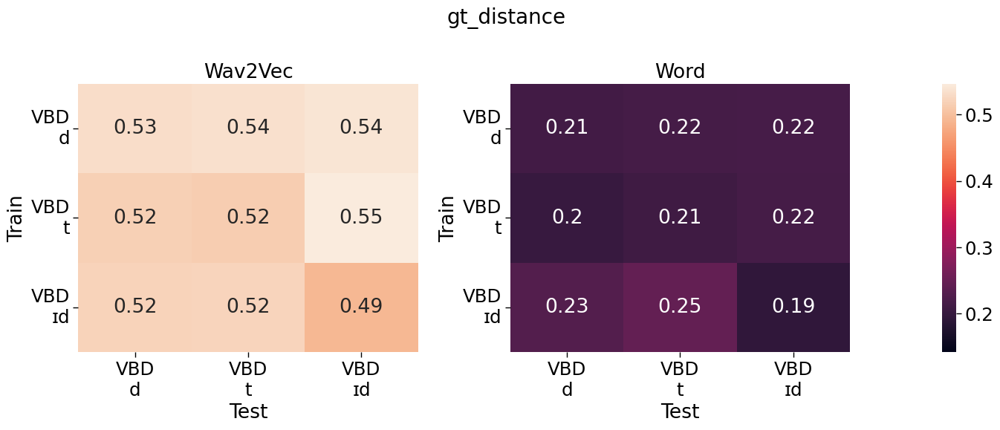

In [75]:
for metric in plot_metrics:
    vmin = 0 if metric == "correct" else nnvb_results_summary[metric].min()
    vmax = vbd_results_summary[metric].max()

    f, axs = plt.subplots(1, 3, figsize=(7 * 2, 6), gridspec_kw={'width_ratios': [1, 1, 0.04]})
    f.suptitle(f"{metric}", fontsize=20)
    for i, (ax, (model_label, rows)) in enumerate(zip(axs, vbd_results_summary.groupby("model_label"))):
        cbar_ax = None
        if i == 1:
            cbar_ax = axs.flat[-1]

        ax.set_title(model_label)
        sns.heatmap(rows.set_index(["source_label", "target_label"]).sort_index()[metric].unstack("target_label"),
                    vmin=vmin, vmax=vmax,
                    annot=True, ax=ax,
                    cbar=i == 1, cbar_ax=cbar_ax)

        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("Train")
        ax.set_xlabel("Test")

    f.tight_layout()
    f.savefig(f"{output_dir}/vbd_allomorphs-{metric}.pdf")

### Regression analysis

In [76]:
def get_vbd_interaction_strength(rows):
    rows["correct"] = rows.correct.astype(int)
    
    # exclude rare
    rows = rows[~((rows.inflection_from == "VBZ") & rows.inflection_from == "IH Z") &
                ~((rows.inflection_to == "VBZ") & rows.inflection_to == "IH Z")]
    
    # standardize frequency
    rows["from_freq"] = (rows.from_freq - rows.from_freq.mean()) / rows.from_freq.std()
    rows["to_freq"] = (rows.to_freq - rows.to_freq.mean()) / rows.to_freq.std()
    
    # formula = "correct ~ C(inflection_from, Treatment(reference='NNS')) * C(inflection_to, Treatment(reference='NNS')) + " \
    #           "C(allomorph_from, Treatment(reference='Z')) * C(allomorph_to, Treatment(reference='Z')) +" \
    #           "from_freq + to_freq"
    # model = logit(formula, data=rows).fit()

    formula = "gt_label_rank ~ C(allomorph_from, Treatment(reference='T')) * C(allomorph_to, Treatment(reference='T')) +" \
              "from_freq + to_freq"
    # fit OLS, remove outliers
    model = ols(formula, data=rows[rows.gt_label_rank < np.percentile(rows.gt_label_rank, 90)]).fit()

    return model.params

In [77]:
vbd_interaction_model_fits = all_vbd_results.groupby(run_groupers).apply(get_vbd_interaction_strength) \
    .reset_index().melt(id_vars=run_groupers, value_name="coef_norm")
vbd_interaction_model_fits = vbd_interaction_model_fits[vbd_interaction_model_fits.variable.str.contains(":", regex=True)]
vbd_interaction_model_fits = vbd_interaction_model_fits.groupby(run_groupers).coef_norm.apply(lambda xs: np.linalg.norm(xs, ord=1)).sort_values()

/tmp/ipykernel_1259256/470275427.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  vbd_interaction_model_fits = all_vbd_results.groupby(run_groupers).apply(get_vbd_interaction_strength) \


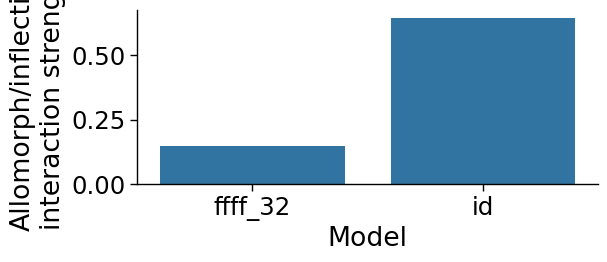

In [78]:
plot_is = vbd_interaction_model_fits.reindex(plot_runs).reset_index()
plot_is["layer"] = plot_is.base_model_name.str.extract(r"_(\d+)$").astype(int)

g = sns.catplot(data=plot_is[plot_is.layer == 8], x="model_name", y="coef_norm", kind="bar", height=3, aspect=2)
g.axes.flat[0].set_ylabel("Allomorph/inflection\ninteraction strength")
g.axes.flat[0].set_xlabel("Model")

g.savefig(f"{output_dir}/vbd_interaction_strength.pdf")

## False friend analysis

In [79]:
all_ff_results_list = []

for run, run_results in all_results.groupby(run_groupers):
    run_results = run_results.set_index("experiment")
    false_friend_expts = run_results.index.unique()
    false_friend_expts = false_friend_expts[false_friend_expts.str.contains("FF")]

    for expt_name in false_friend_expts:
        expt_df = run_results.loc[[expt_name]].copy()
        num_seen_words = min(len(expt_df.base_from.unique()), len(expt_df.base_to.unique()))

        if num_seen_words < 10:
            print(f"Skipping {expt} due to only {num_seen_words} seen words")
            continue

        if expt_name.count("-FF-") == 2:
            allomorph_from, allomorph_to = re.findall(r"-FF-([\w\s]+)-to-.+FF-([\w\s]+)", expt_name)[0]
            ff_from, ff_to = True, True
        else:
            try:
                allomorph_from, allomorph_to = re.findall(r"_([\w\s]+)-to-.+FF-([\w\s]+)", expt_name)[0]
                # is the false friend on the "from" side?
                ff_from, ff_to = False, True
            except:
                allomorph_from, allomorph_to = re.findall(r".+FF-([\w\s]+)-to-.+_([\w\s]+)", expt_name)[0]
                ff_from, ff_to = True, False

        expt_df["allomorph_from"] = allomorph_from
        expt_df["allomorph_to"] = allomorph_to

        if ff_from:
            expt_df["inflection_from"] = expt_df.inflection_from.str.replace("-FF-.+", "-FF", regex=True)
        if ff_to:
            expt_df["inflection_to"] = expt_df.inflection_to.str.replace("-FF-.+", "-FF", regex=True)

        expt_df["ff_from"] = ff_from
        expt_df["ff_to"] = ff_to

        all_ff_results_list.append(expt_df)

    # add within-false-friend tests
    expt_df = run_results.loc["false_friends"].copy()
    expt_df["allomorph_from"] = expt_df.inflection_from.str.extract(r"FF-(.+)$")
    expt_df["allomorph_to"] = expt_df.inflection_to.str.extract(r"FF-(.+)$")
    expt_df["inflection_from"] = expt_df.inflection_from.str.replace("-FF-.+", "-FF", regex=True)
    expt_df["inflection_to"] = expt_df.inflection_to.str.replace("-FF-.+", "-FF", regex=True)
    expt_df["ff_from"] = True
    expt_df["ff_to"] = True

    all_ff_results_list.append(expt_df)

    # expt_df = expt_df[expt_df.inflection_from.isin(all_ff_results.inflection_from.unique())]

all_ff_results = pd.concat(all_ff_results_list).reset_index()

ff_exclude = "a b c wreck d e eh wandering lo chiu ha hahn meek jew shew ah co des re san ol der k la ye ll"
ff_exclude_inflected = "bunce los oft mast hauled sward rose mind mist past"

# exclude FF bases
all_ff_results = all_ff_results[~(all_ff_results.inflection_from.str.endswith("-FF") & all_ff_results.base_from.isin(ff_exclude.split()))]
all_ff_results = all_ff_results[~(all_ff_results.inflection_to.str.endswith("-FF") & all_ff_results.base_to.isin(ff_exclude.split()))]

all_ff_results["inflected_from"] = all_ff_results.from_equiv_label.apply(lambda x: eval(x)[1])
all_ff_results["inflected_to"] = all_ff_results.to_equiv_label.apply(lambda x: eval(x)[1])

# exclude FF inflected
all_ff_results = all_ff_results[~(all_ff_results.inflection_from.str.endswith("-FF") & all_ff_results.inflected_from.isin(ff_exclude_inflected.split()))]
all_ff_results = all_ff_results[~(all_ff_results.inflection_to.str.endswith("-FF") & all_ff_results.inflected_to.isin(ff_exclude_inflected.split()))]

# add frequency information
all_ff_results = pd.merge(all_ff_results, word_freq_df["LogFreq"].rename("from_base_freq"), left_on="base_from", right_index=True)
all_ff_results = pd.merge(all_ff_results, word_freq_df["LogFreq"].rename("to_base_freq"), left_on="base_to", right_index=True)
all_ff_results = pd.merge(all_ff_results, word_freq_df["LogFreq"].rename("from_inflected_freq"), left_on="inflected_from", right_index=True)
all_ff_results = pd.merge(all_ff_results, word_freq_df["LogFreq"].rename("to_inflected_freq"), left_on="inflected_to", right_index=True)
all_ff_results["from_freq"] = all_ff_results[["from_base_freq", "from_inflected_freq"]].mean(axis=1)
all_ff_results["to_freq"] = all_ff_results[["to_base_freq", "to_inflected_freq"]].mean(axis=1)

all_ff_results["transfer_label"] = all_ff_results.inflection_from + " -> " + all_ff_results.inflection_to

Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 8 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen words
Skipping unambiguous-VBZ_IH Z_to_VBZ_IH Z due to only 1 seen w

In [80]:
# Post-hoc fix some bugs
all_ff_results.loc[(all_ff_results.base_to == "tho") & (all_ff_results.predicted_label == "though") & (all_ff_results.gt_label_rank == 1), "correct"] = True
all_ff_results.loc[(all_ff_results.base_to == "philip") & (all_ff_results.predicted_label == "philip's"), "correct"] = True
all_ff_results.loc[(all_ff_results.base_to == "adam") & (all_ff_results.predicted_label == "adam's"), "correct"] = True
all_ff_results.loc[(all_ff_results.base_to == "who") & (all_ff_results.predicted_label == "who's"), "correct"] = True

In [81]:
# exclude bad VBD bases
print("before filtering: ", len(all_ff_results))
all_ff_results = all_ff_results[~(((all_ff_results.inflection_to == "VBD") & all_ff_results.base_to.isin(exclude_vbd_base)) |
                                  ((all_ff_results.inflection_from == "VBD") & all_ff_results.base_from.isin(exclude_vbd_base)))]
print("after filtering: ", len(all_ff_results))

before filtering:  1234899
after filtering:  1228371


In [82]:
false_friend_strong_lookup = false_friends_df.set_index(["base", "inflected", "post_divergence"]).strong.to_dict()

# manual
false_friend_strong_lookup["for", "force", "S"] = False
false_friend_strong_lookup["gray", "grace", "S"] = False
false_friend_strong_lookup["home", "holmes", "Z"] = True
false_friend_strong_lookup["how", "house", "S"] = False
false_friend_strong_lookup["law", "loss", "S"] = False
false_friend_strong_lookup["my", "mice", "S"] = False
false_friend_strong_lookup["neck", "next", "S"] = True
false_friend_strong_lookup["play", "place", "S"] = False
false_friend_strong_lookup["though", "those", "Z"] = True
false_friend_strong_lookup["the", "thus", "S"] = False
false_friend_strong_lookup["you", "use", "S"] = False
false_friend_strong_lookup["you", "use", "Z"] = True
false_friend_strong_lookup["an", "aunt", "T"] = False
false_friend_strong_lookup["cap", "kept", "T"] = True
false_friend_strong_lookup["loss", "lost", "T"] = True
false_friend_strong_lookup["men", "meant", "T"] = False
false_friend_strong_lookup["plan", "plant", "T"] = False
false_friend_strong_lookup["saw", "sought", "T"] = False
false_friend_strong_lookup["stay", "state", "T"] = False
false_friend_strong_lookup["the", "that", "T"] = False
false_friend_strong_lookup["way", "wait", "T"] = False
false_friend_strong_lookup["when", "wind", "D"] = True
false_friend_strong_lookup["row", "wrote", "T"] = False

In [83]:
sorted(all_ff_results[all_ff_results.group.astype("str").str.contains("NNS|VBZ", regex=True)]
       .query("model_name == 'ffff_32' and experiment == 'false_friends'").from_equiv_label.unique())

["('adam', 'adams', 'Z')",
 "('afterward', 'afterwards', 'Z')",
 "('are', 'ours', 'Z')",
 "('backward', 'backwards', 'Z')",
 "('barbara', 'barbarous', 'S')",
 "('bay', 'base', 'S')",
 "('beside', 'besides', 'Z')",
 "('dan', 'dance', 'S')",
 "('den', 'dense', 'S')",
 "('dew', 'deuce', 'S')",
 "('fall', 'false', 'S')",
 "('far', 'farce', 'S')",
 "('fear', 'fierce', 'S')",
 "('flee', 'fleece', 'S')",
 "('fro', 'froze', 'Z')",
 "('hen', 'hence', 'S')",
 "('her', 'hearse', 'S')",
 "('her', 'hers', 'Z')",
 "('joy', 'joyce', 'S')",
 "('julia', 'julius', 'S')",
 "('lay', 'lace', 'S')",
 "('louis', 'louise', 'Z')",
 "('militia', 'malicious', 'S')",
 "('one', 'once', 'S')",
 "('patricia', 'patricius', 'S')",
 "('peer', 'pierce', 'S')",
 "('per', 'purse', 'S')",
 "('philip', 'phillips', 'S')",
 "('ran', 'rance', 'S')",
 "('really', 'release', 'S')",
 "('river', 'reverse', 'S')",
 "('robert', 'roberts', 'S')",
 "('saw', 'sauce', 'S')",
 "('scare', 'scarce', 'S')",
 "('sick', 'six', 'S')",
 "('sin'

In [84]:
def get_is_strong(rows):
    keys = []
    row = rows.iloc[0]
    if "-FF" in row.inflection_from:
        keys.append((row.base_from, row.inflected_from, row.allomorph_from))
    if "-FF" in row.inflection_to:
        keys.append((row.base_to, row.inflected_to, row.allomorph_to))

    # print(keys)
    strong_results = [false_friend_strong_lookup[base, inflected, allomorph] for base, inflected, allomorph in keys]
    return all(strong_results)

strong_grouper = ["inflection_from", "inflection_to", "inflected_from", "inflected_to", "base_from", "base_to", "allomorph_from", "allomorph_to"]
strong_values = all_ff_results.groupby(strong_grouper).apply(get_is_strong).rename("is_strong")
all_ff_results = pd.merge(all_ff_results, strong_values, left_on=strong_grouper, right_index=True)

/tmp/ipykernel_1259256/500092804.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  strong_values = all_ff_results.groupby(strong_grouper).apply(get_is_strong).rename("is_strong")


In [85]:
weak_ff_results = all_ff_results[~all_ff_results.is_strong]

# ONLY STRONG
all_ff_results = all_ff_results[all_ff_results.is_strong]

In [86]:
all_ff_results.query("inflection_from == 'VBD-FF' & inflection_to == 'VBD' and model_name == 'ffff_32' and base_model_name == 'w2v2_8'") \
    .groupby("base_to").gt_label_rank.mean().sort_values().tail(20)

base_to
issue        735.000000
lack         741.666667
hop          786.500000
command      893.000000
assault     1038.000000
doubt       1115.500000
frown       1440.000000
perch       1673.000000
punish      1680.000000
chase       1763.000000
shelter     1983.000000
glow        2039.250000
hail        2778.000000
vow         2925.000000
peep        3219.000000
block       3681.000000
chance      3726.750000
clutch      4252.833333
circle      4464.666667
peer       39113.000000
Name: gt_label_rank, dtype: float64

### Main FF analysis

In [87]:
ff_frequency_bins = pd.qcut(pd.concat([all_ff_results.to_freq, all_ff_results.from_freq]), q=3, retbins=True)[1]
all_ff_results["from_freq_bin"] = pd.cut(all_ff_results.from_freq, bins=ff_frequency_bins, labels=[f"Q{i}" for i in range(1, 4)])
all_ff_results["to_freq_bin"] = pd.cut(all_ff_results.to_freq, bins=ff_frequency_bins, labels=[f"Q{i}" for i in range(1, 4)])

In [88]:
# Compare distribution of false friend word frequencies to distribution of NN/VB frequencies.
# This is to see if the false friends are more likely to be rare words.
false_friend_words = pd.concat([all_ff_results.query("ff_from").base_from, all_ff_results.query("ff_to").base_to]).unique()
nn_words = pd.concat([all_nnvb_results.query("inflection_from == 'NNS'").base_from,
                        all_nnvb_results.query("inflection_to == 'NNS'").base_to]).unique()
vb_words = pd.concat([all_nnvb_results.query("inflection_from == 'VBZ'").base_from,
                        all_nnvb_results.query("inflection_to == 'VBZ'").base_to]).unique()

In [89]:
expt_word_freqs = pd.concat({
    "false_friends": word_freq_df.loc[false_friend_words].LogFreq,
    "NN": word_freq_df.loc[nn_words].LogFreq,
    "VB": word_freq_df.loc[vb_words].LogFreq
}, names=["type"])

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/

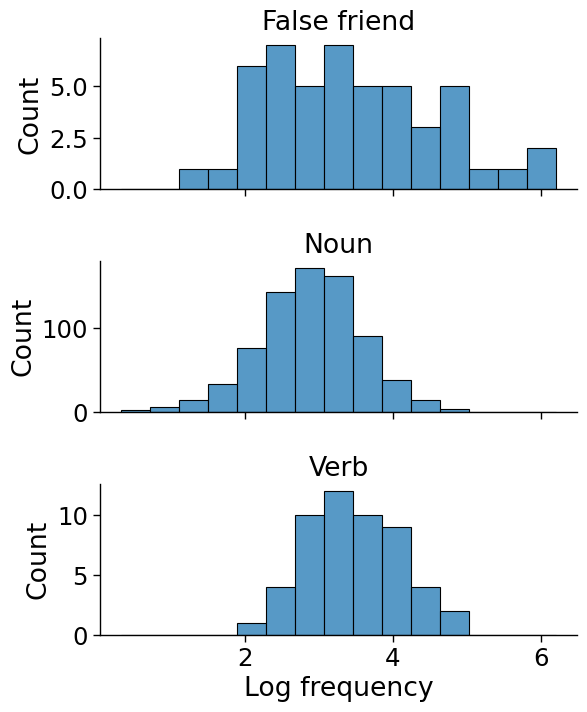

In [97]:
g = sns.displot(data=expt_word_freqs.reset_index().assign(type=lambda xs: xs.type.map({"NN": "Noun", "VB": "Verb", "false_friends": "False friend"})), x="LogFreq", row="type", kind="hist", bins=15,
            height=2.5, aspect=2.5, facet_kws={"sharey": False})
for ax in g.axes.flat:
    ax.set_xlabel("Log frequency")
    ax.set_ylabel("Count")
    ax.set_title(ax.get_title().split(" = ")[-1])

g.savefig(f"{output_dir}/false_friend_word_freqs.pdf", bbox_inches="tight")

In [98]:
focus_ff_results = all_ff_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")
foil_ff_results = all_ff_results.query("base_model_name == @foil_base_model and model_name == @foil_model and equivalence == @foil_equivalence")

In [131]:
ff_results_summary2 = pd.concat([focus_ff_results, foil_ff_results]).groupby(["model_name", "inflection_from", "inflection_to"]) \
    [plot_metrics].mean().reset_index()
ff_results_summary2["transfer_label"] = ff_results_summary2.inflection_from + " -> " + ff_results_summary2.inflection_to
assert set(ff_results_summary2.model_name) == {"ffff_32", "id"}
ff_results_summary2["model_label"] = ff_results_summary2["model_name"].map({"id": "Wav2Vec", "ffff_32": "Word"})
ff_results_summary2 = ff_results_summary2.drop(columns=["model_name"])

ff_results_summary2 = pd.concat([ff_results_summary2,
    nnvb_results_summary2.query("inflection_from == inflection_to"),
    vbd_results_summary2.query("inflection_from == inflection_to")])

ff_results_summary2["base_inflection"] = ff_results_summary2.inflection_from.str.replace("-FF", "")
ff_results_summary2 = ff_results_summary2[ff_results_summary2.base_inflection.isin(plot_inflections)]

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)


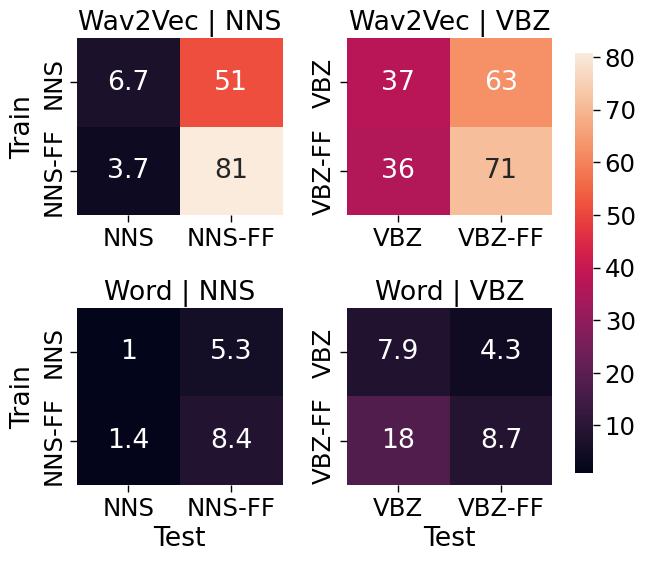

In [132]:
g = sns.FacetGrid(data=ff_results_summary2, row="model_label", col="base_inflection",
                  row_order=["Wav2Vec", "Word"], sharex=False, sharey=False)
plot_variable = "gt_label_rank"

vmin = ff_results_summary2[plot_variable].min()
vmax = ff_results_summary2[plot_variable].max()

def mapfn(data, **kwargs):
    ax = plt.gca()
    sns.heatmap(data.set_index(["inflection_from", "inflection_to"])[plot_variable].unstack("inflection_to"),
                vmin=vmin, vmax=vmax, annot=True, fmt=".2g", ax=ax, cbar=False)

g.map_dataframe(mapfn)

for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        ax.set_title(ax.get_title().replace("base_inflection = ", "").replace("model_label = ", ""))
        if j > 0:
            ax.set_ylabel("")
        else:
            ax.set_ylabel("Train")
        
        if i < len(g.axes) - 1:
            ax.set_xlabel("")
        else:
            ax.set_xlabel("Test")

# add colorbar
cbar_ax = g.fig.add_axes([0.99, 0.18, 0.03, 0.7])
cbar = plt.colorbar(g.axes.flat[0].collections[0], cax=cbar_ax)
cbar.outline.set_visible(False)

g.tight_layout()
g.savefig(f"{output_dir}/ff_results-merged.pdf", bbox_inches="tight")

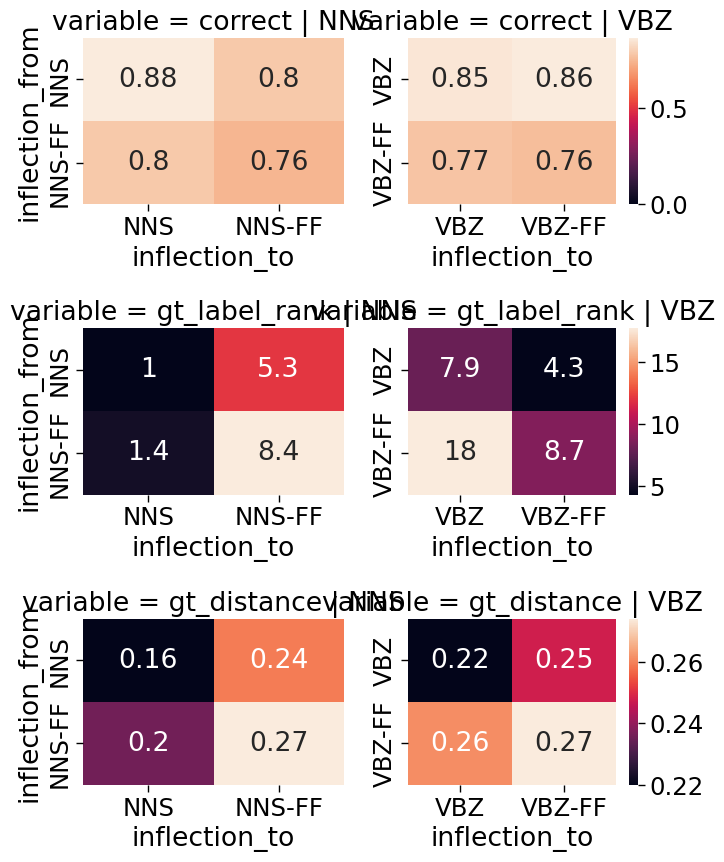

In [102]:
ff_results_summary2 = focus_ff_results.groupby(["inflection_from", "inflection_to"]) \
    [plot_metrics].mean().reset_index()

ff_results_summary2["transfer_label"] = ff_results_summary2.inflection_from + " -> " + ff_results_summary2.inflection_to

# add in data for NNS->NNS and VBZ->VBZ
ff_results_summary2 = pd.concat([
    ff_results_summary2,
    nnvb_results_summary2.query("inflection_from == inflection_to and model_label == 'Word'"),
    vbd_results_summary2.query("inflection_from == inflection_to and model_label == 'Word'")], axis=0)

ff_results_summary2["base_inflection"] = ff_results_summary2.inflection_from.str.replace("-FF", "")
ff_results_summary2 = ff_results_summary2[ff_results_summary2.base_inflection.isin(plot_inflections)]

# g = sns.FacetGrid(ff_results_summary2, col="base_inflection", sharex=False, sharey=False)
g = sns.FacetGrid(data=ff_results_summary2.melt(id_vars=["inflection_from", "inflection_to", "transfer_label", "base_inflection"],
                                                value_vars=plot_metrics),
                    col="base_inflection", row="variable", sharex=False, sharey=False,
                    height=3, aspect=1.25)

def mapfn(data, **kwargs):
    ax = plt.gca()
    metric = data.variable.iloc[0]
    vmin = 0 if metric == "correct" else data.value.min()
    vmax = data.value.max()

    sns.heatmap(data.set_index(["inflection_from", "inflection_to"]).value.unstack("inflection_to"),
                vmin=vmin, vmax=vmax, annot=True, ax=ax)

g.map_dataframe(mapfn)

for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        ax.set_title(ax.get_title().replace("base_inflection = ", ""))
        if j > 0:
            ax.set_ylabel("")
        if j < len(row) - 1:
            ax.collections[0].colorbar.remove()

g.fig.tight_layout()
g.fig.savefig(f"{output_dir}/ff_results.pdf")

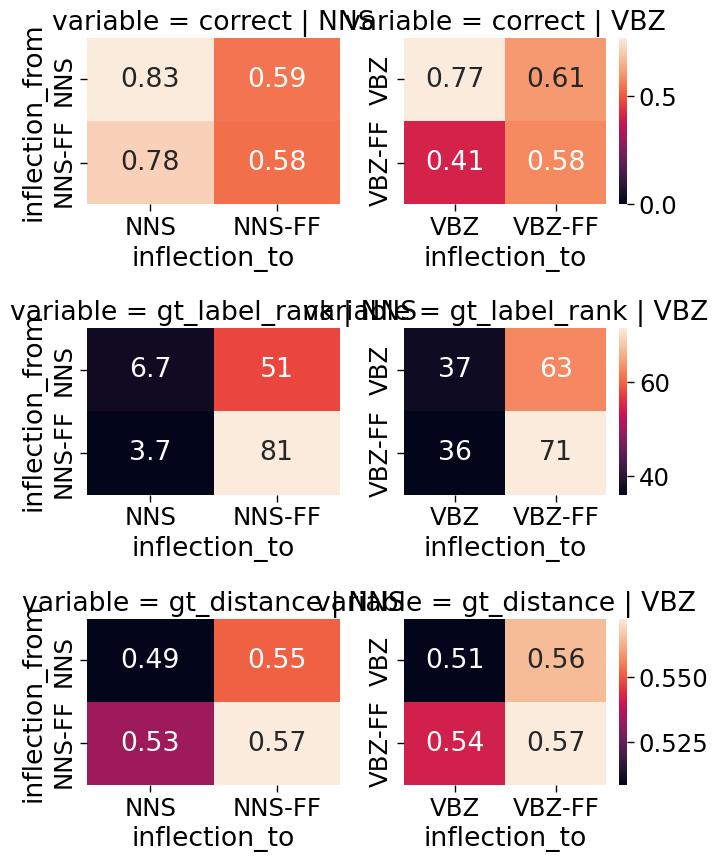

In [103]:
ff_foil_results_summary2 = foil_ff_results.groupby(["inflection_from", "inflection_to"]) \
    [["correct", "gt_label_rank", "gt_distance"]].mean().reset_index()

ff_foil_results_summary2["transfer_label"] = ff_foil_results_summary2.inflection_from + " -> " + ff_foil_results_summary2.inflection_to

# add in data for NNS->NNS and VBZ->VBZ
ff_foil_results_summary2 = pd.concat([
    ff_foil_results_summary2,
    nnvb_results_summary2.query("inflection_from == inflection_to and model_label == 'Wav2Vec'"),
    vbd_results_summary2.query("inflection_from == inflection_to and model_label == 'Wav2Vec'")], axis=0)

ff_foil_results_summary2["base_inflection"] = ff_foil_results_summary2.inflection_from.str.replace("-FF", "")

ff_foil_results_summary2 = ff_foil_results_summary2[ff_foil_results_summary2.base_inflection.isin(plot_inflections)]

g = sns.FacetGrid(data=ff_foil_results_summary2.melt(id_vars=["inflection_from", "inflection_to", "transfer_label", "base_inflection"],
                                                value_vars=plot_metrics),
                    col="base_inflection", row="variable", sharex=False, sharey=False,
                    height=3, aspect=1.25)
def mapfn(data, **kwargs):
    ax = plt.gca()
    metric = data.variable.iloc[0]
    vmin = 0 if metric == "correct" else data.value.min()
    vmax = data.value.max()

    sns.heatmap(data.set_index(["inflection_from", "inflection_to"]).value.unstack("inflection_to"),
                vmin=vmin, vmax=vmax, annot=True, ax=ax)
g.map_dataframe(mapfn)

for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        ax.set_title(ax.get_title().replace("base_inflection = ", ""))
        if j > 0:
            ax.set_ylabel("")
        if j < len(row) - 1:
            ax.collections[0].colorbar.remove()

g.fig.tight_layout()
g.fig.savefig(f"{output_dir}/ff_results-foil.pdf")

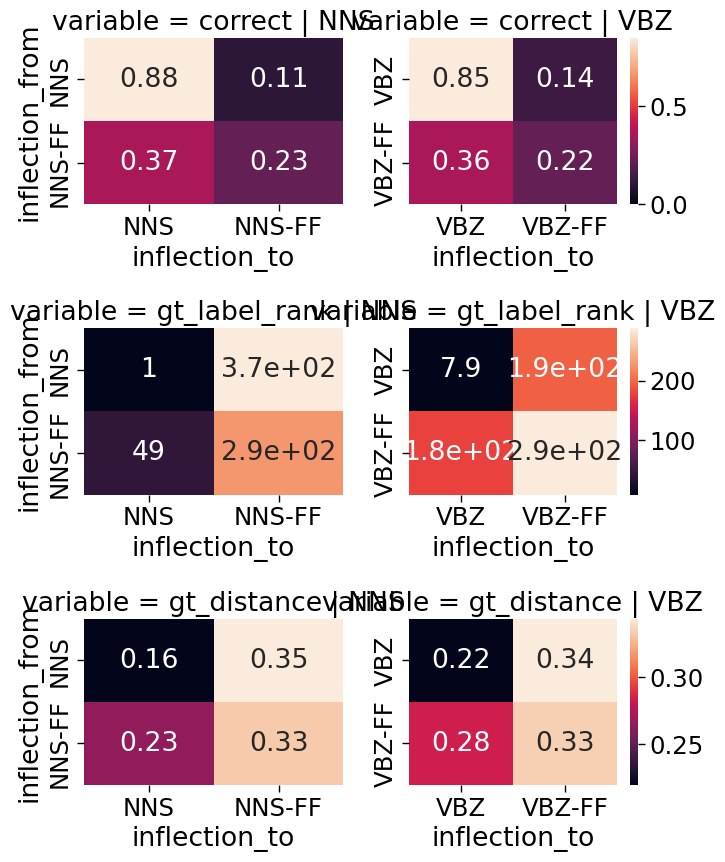

In [104]:
focus_weak_ff_results = weak_ff_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")

weak_ff_results_summary2 = focus_weak_ff_results.groupby(["inflection_from", "inflection_to"]) \
    [["correct", "gt_label_rank", "gt_distance"]].mean().reset_index()

weak_ff_results_summary2["transfer_label"] = weak_ff_results_summary2.inflection_from + " -> " + weak_ff_results_summary2.inflection_to

# add in data for NNS->NNS and VBZ->VBZ
weak_ff_results_summary2 = pd.concat([weak_ff_results_summary2, nnvb_results_summary2.query("inflection_from == inflection_to and model_label == 'Word'")], axis=0)
# add in data for VBD->VBD
weak_ff_results_summary2 = pd.concat([weak_ff_results_summary2, vbd_results_summary2.query("inflection_from == inflection_to and model_label == 'Word'")], axis=0)

weak_ff_results_summary2["base_inflection"] = weak_ff_results_summary2.inflection_from.str.replace("-FF", "")

weak_ff_results_summary2 = weak_ff_results_summary2[weak_ff_results_summary2.base_inflection.isin(plot_inflections)]

g = sns.FacetGrid(data=weak_ff_results_summary2.melt(id_vars=["inflection_from", "inflection_to", "transfer_label", "base_inflection"],
                                                value_vars=plot_metrics),
                    col="base_inflection", row="variable", sharex=False, sharey=False,
                    height=3, aspect=1.25)
def mapfn(data, **kwargs):
    ax = plt.gca()
    metric = data.variable.iloc[0]
    vmin = 0 if metric == "correct" else data.value.min()
    vmax = data.value.max()

    sns.heatmap(data.set_index(["inflection_from", "inflection_to"]).value.unstack("inflection_to"),
                vmin=vmin, vmax=vmax, annot=True, ax=ax)
    
g.map_dataframe(mapfn)

for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        ax.set_title(ax.get_title().replace("base_inflection = ", ""))
        if j > 0:
            ax.set_ylabel("")
        if j < len(row) - 1:
            ax.collections[0].colorbar.remove()

g.fig.tight_layout()
g.fig.savefig(f"{output_dir}/ff_results_weak.pdf")

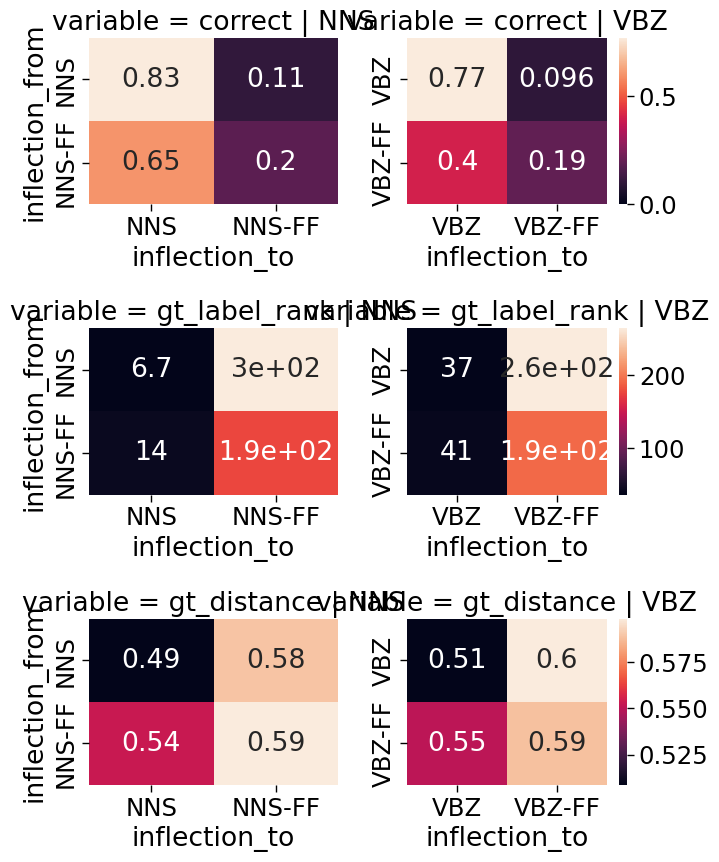

In [105]:
foil_weak_ff_results = weak_ff_results.query("base_model_name == @foil_base_model and model_name == @foil_model and equivalence == @foil_equivalence")

weak_ff_foil_results_summary2 = foil_weak_ff_results.groupby(["inflection_from", "inflection_to"]) \
    [["correct", "gt_label_rank", "gt_distance"]].mean().reset_index()

weak_ff_foil_results_summary2["transfer_label"] = weak_ff_foil_results_summary2.inflection_from + " -> " + weak_ff_foil_results_summary2.inflection_to

# add in data for NNS->NNS and VBZ->VBZ
weak_ff_foil_results_summary2 = pd.concat([weak_ff_foil_results_summary2, nnvb_results_summary2.query("inflection_from == inflection_to and model_label == 'Wav2Vec'")], axis=0)
# add in data for VBD->VBD
weak_ff_foil_results_summary2 = pd.concat([weak_ff_foil_results_summary2, vbd_results_summary2.query("inflection_from == inflection_to and model_label == 'Wav2Vec'")], axis=0)

weak_ff_foil_results_summary2["base_inflection"] = weak_ff_foil_results_summary2.inflection_from.str.replace("-FF", "")

weak_ff_foil_results_summary2 = weak_ff_foil_results_summary2[weak_ff_foil_results_summary2.base_inflection.isin(plot_inflections)]

g = sns.FacetGrid(data=weak_ff_foil_results_summary2.melt(id_vars=["inflection_from", "inflection_to", "transfer_label", "base_inflection"],
                                                value_vars=plot_metrics),
                    col="base_inflection", row="variable", sharex=False, sharey=False,
                    height=3, aspect=1.25)
def mapfn(data, **kwargs):
    ax = plt.gca()
    metric = data.variable.iloc[0]
    vmin = 0 if metric == "correct" else data.value.min()
    vmax = data.value.max()

    sns.heatmap(data.set_index(["inflection_from", "inflection_to"]).value.unstack("inflection_to"),
                vmin=vmin, vmax=vmax, annot=True, ax=ax)
    
g.map_dataframe(mapfn)
for i, row in enumerate(g.axes):
    for j, ax in enumerate(row):
        ax.set_title(ax.get_title().replace("base_inflection = ", ""))
        if j > 0:
            ax.set_ylabel("")
        if j < len(row) - 1:
            ax.collections[0].colorbar.remove()

g.fig.tight_layout()
g.fig.savefig(f"{output_dir}/ff_results_weak-foil.pdf")

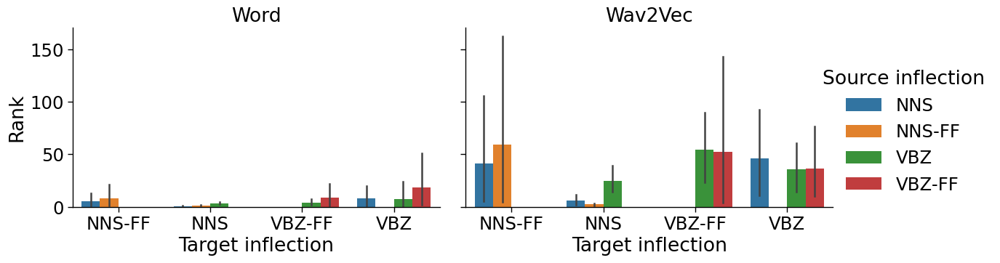

In [154]:
ff_plot = pd.concat([
        focus_ff_results.groupby(run_groupers + ["inflection_from", "inflection_to", "base_to"]).gt_label_rank.mean().reset_index(),
        foil_ff_results.groupby(run_groupers + ["inflection_from", "inflection_to", "base_to"]).gt_label_rank.mean().reset_index(),
        nnvb_focus.groupby(run_groupers + ["inflection_from", "inflection_to", "base_to"]).gt_label_rank.mean().reset_index(),
    ]).assign(model_name=lambda xs: xs.model_name.map({"ffff_32": "Word", "id": "Wav2Vec"}),
              base_inflection=lambda xs: xs.inflection_from.str.replace("-FF", ""))
ff_plot = ff_plot[ff_plot.base_inflection.isin(plot_inflections)]
g = sns.catplot(
    data=ff_plot,
    x="inflection_to", hue="inflection_from", y="gt_label_rank", col="model_name",
    kind="bar", height=4, aspect=1.5)

g.legend.set_title("Source inflection")
for ax in g.axes.flat:
    ax.set_xlabel("Target inflection")
    ax.set_ylabel("Rank")
    ax.set_title(ax.get_title().split(" = ")[-1])

g.savefig(f"{output_dir}/ff_results_barplot.pdf", bbox_inches="tight")

### Frequency analysis

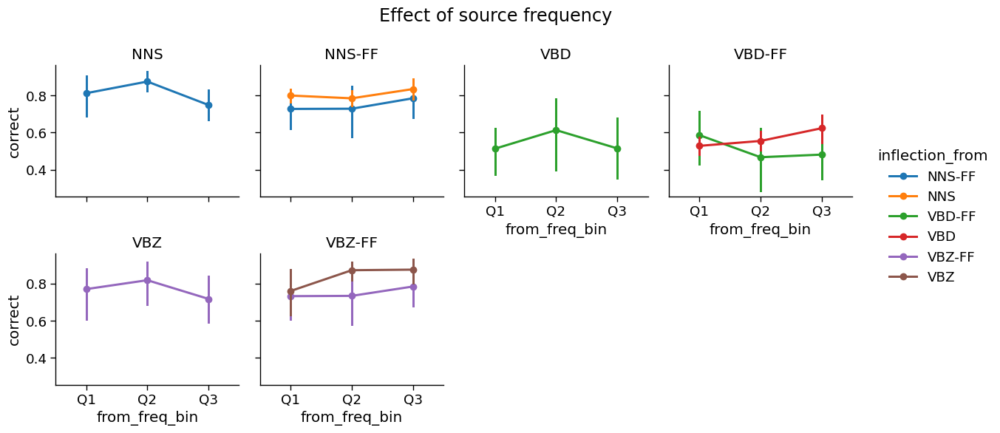

In [ ]:
g = sns.catplot(data=focus_ff_results,
            x="from_freq_bin", y="correct", hue="inflection_from",
            col="inflection_to", col_wrap=4, units="base_from", kind="point", height=3)
g.figure.suptitle("Effect of source frequency")
for ax in g.axes.flat:
    ax.set_title(ax.get_title().split("=")[1].strip())
g.tight_layout()

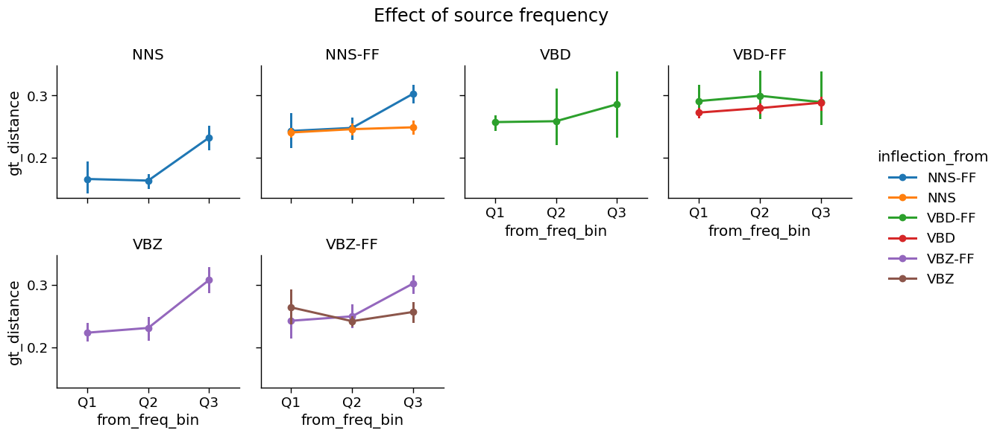

In [ ]:
g = sns.catplot(data=focus_ff_results,
            x="from_freq_bin", y="gt_distance", hue="inflection_from",
            col="inflection_to", col_wrap=4, units="base_from", kind="point", height=3)
g.figure.suptitle("Effect of source frequency")
for ax in g.axes.flat:
    ax.set_title(ax.get_title().split("=")[1].strip())
g.tight_layout()

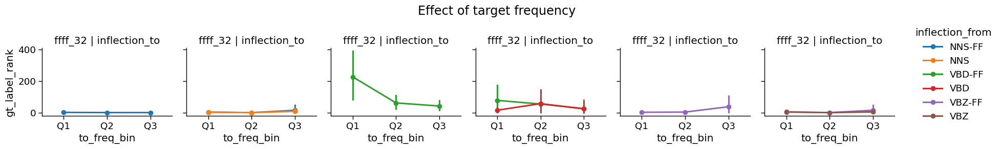

In [ ]:
g = sns.catplot(data=focus_ff_results,
            x="to_freq_bin", y="gt_label_rank", hue="inflection_from",
            col="inflection_to", row="model_name", units="base_to", kind="point", height=3)
g.figure.suptitle("Effect of target frequency")
for ax in g.axes.flat:
    ax.set_title(ax.get_title().split("=")[1].strip())
g.tight_layout()

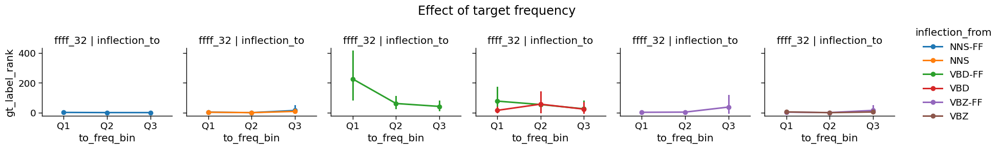

In [ ]:
g = sns.catplot(data=focus_ff_results,
            x="to_freq_bin", y="gt_label_rank", hue="inflection_from",
            col="inflection_to", row="model_name", units="base_to", kind="point", height=3)
g.figure.suptitle("Effect of target frequency")
for ax in g.axes.flat:
    ax.set_title(ax.get_title().split("=")[1].strip())
g.tight_layout()

## Forced-choice analysis

In [155]:
state_space = StateSpaceAnalysisSpec.from_hdf5(state_space_path)

/scratch/jgauthier/transformers/lib/python3.10/site-packages/tables/attributeset.py:295: DataTypeWarning: Unsupported type for attribute 'labels_are_repr' in node '/'. Offending HDF5 class: 8
  value = self._g_getattr(self._v_node, name)


In [156]:
def guess_nns_vbz_allomorph(base_phones):
    """
    Given a list of CMUDICT phones for a base form, 
    return the 'expected' post-divergence allomorph 
    (S, Z, or IH Z, etc.) for the English plural / 3sg verb.
    """
    last_phone = base_phones[-1]

    # Define sets or lists for final-phoneme checks
    SIBILANTS = {"S", "Z", "SH", "CH", "JH", "ZH"}
    VOICELESS = {"P", "T", "K", "F", "TH"}  # Could add others as needed
    
    if last_phone in SIBILANTS:
        # e.g., 'CH' -> "IH Z"
        return "IH Z"
    elif last_phone in VOICELESS:
        # e.g., 'K', 'P', 'T' -> "S"
        return "S"
    else:
        # default to voiced => "Z"
        return "Z"


def guess_past_allomorph(base_phones):
    """
    Given a list of CMUDICT phones for a base form,
    return the 'expected' post-divergence allomorph
    (T, D, or IH D) for the English past tense.
    """
    last_phone = base_phones[-1]

    ALVEOLAR_STOPS = {"T", "D"}
    # Example set of voiceless consonants (non-exhaustive—adjust as needed).
    VOICELESS = {"P", "F", "K", "S", "SH", "CH", "TH"}
    
    if last_phone in ALVEOLAR_STOPS:
        # E.g., "want" -> "wanted" => "AH0 D"
        return "IH D"
    elif last_phone in VOICELESS:
        # E.g., "jump" -> "jumped" => "T"
        return "T"
    else:
        # default to voiced => "D"
        return "D"
    
STRONG_GUESSERS = {
    "Z_S": guess_nns_vbz_allomorph,
    "D_T": guess_past_allomorph,
    "T_IH D": guess_past_allomorph,
    "D_IH D": guess_past_allomorph,
}

WEAK_SPACES = {
    "Z_S": {"Z", "S", "IH Z"},
    "D_T": {"D", "T", "IH D"},
    "T_IH D": {"D", "T", "IH D"},
    "D_IH D": {"D", "T", "IH D"},
}

In [157]:
cuts_df = state_space.cuts.xs("phoneme", level="level").drop(columns=["onset_frame_idx", "offset_frame_idx"])
cuts_df["label_idx"] = cuts_df.index.get_level_values("label").map({l: i for i, l in enumerate(state_space.labels)})
cuts_df["frame_idx"] = cuts_df.groupby(["label", "instance_idx"]).cumcount()
cuts_df = cuts_df.reset_index().set_index(["label", "instance_idx", "frame_idx"]).sort_index()
cut_phonemic_forms = cuts_df.groupby(["label", "instance_idx"]).description.agg(' '.join)

In [158]:
fc_exclude = "ay ba c des eh p k pa ca na b co ben been shun own".split()
fc_exclude_inflected = "look'd push'd los ince".split()

In [159]:
fc_results = all_results.loc[all_results.inflection_to.str.startswith("FC-")].copy()
fc_results = fc_results[~fc_results.base_to.isin(fc_exclude)]
fc_results["fc_pair"] = fc_results.inflection_to.str.extract(r"FC-([\w\s_]+)")
fc_results["inflected_from"] = fc_results.from_equiv_label.apply(lambda x: eval(x)[1])
fc_results["inflected_to"] = fc_results.to_equiv_label.apply(lambda x: eval(x)[1])
fc_results["layer"] = fc_results.base_model_name.str.extract(r"_(\d+)$").astype(int)
fc_results = fc_results[~fc_results.inflected_to.isin(fc_exclude_inflected)]

In [160]:
fc_metadata = all_cross_instances[all_cross_instances.inflection.str.startswith("FC-")] \
    .groupby(["inflection", "base", "inflected"]).head(1) \
        [["inflection", "base", "base_phones",
          "inflected", "inflected_phones", "inflected2", "inflected2_phones",
          "post_divergence"]] \
    .rename(columns={"base": "base_to", "base_phones": "base_to_phones",
                     "inflected": "inflected_to", "inflected_phones": "inflected_to_phones",
                     "inflected2": "inflected2_to", "inflected2_phones": "inflected2_to_phones",
                     "post_divergence": "post_divergence_to"})
fc_metadata["fc_pair"] = fc_metadata.inflection.str.extract(r"FC-([\w\s_]+)")
fc_metadata = fc_metadata.drop(columns=["inflection"])

In [161]:
fc_results = pd.merge(fc_results, fc_metadata, on=["fc_pair", "base_to", "inflected_to"])

In [162]:
fc_results["strong_expected"] = fc_results.apply(lambda xs: STRONG_GUESSERS[xs.fc_pair](xs.base_to_phones.split(" ")), axis=1)
fc_results["strong_phones"] = fc_results.apply(lambda xs: " ".join([xs.base_to_phones, STRONG_GUESSERS[xs.fc_pair](xs.base_to_phones.split(" "))]), axis=1)
fc_results["inflected_to_strong"] = fc_results.apply(lambda xs: xs.inflected_to_phones[len(xs.base_to_phones) + 1:] == xs.strong_expected, axis=1)
fc_results["inflected2_to_strong"] = fc_results.apply(lambda xs: xs.inflected2_to_phones[len(xs.base_to_phones) + 1:] == xs.strong_expected, axis=1)

In [163]:
def cmudict_to_textipa(phones):
    cmudict_to_ipa = {
        "AA": "ɑ",
        "AE": "æ",
        "AH": "ʌ",
        "AO": "ɔ",
        "AW": "aʊ",
        "AY": "aɪ",
        "EH": "ɛ",
        "ER": "ɝ",
        "EY": "eɪ",
        "IH": "ɪ",
        "IY": "i",
        "OW": "oʊ",
        "OY": "ɔɪ",
        "UH": "ʊ",
        "UW": "u",

        "CH": "tʃ",
        "DH": "ð",
        "HH": "h",
        "JH": "dʒ",
        "NG": "ŋ",
        "R": "ɹ",
        "SH": "ʃ",
        "TH": "θ",
        "Y": "j",
        "ZH": "ʒ",
    }

    ipa_to_textipa = {
        "ɑ": "A",
        "æ": r"\ae",
        "ʌ": "2",
        "ɔ": "O",
        "aʊ": r"aU",
        "aɪ": r"aI",
        "ɛ": "E",
        "ɝ": r"3\textrhoticity{}",
        "eɪ": r"eI",
        "ɪ": "I",
        "oʊ": r"oU",
        "ɔɪ": r"OI",
        "ʊ": "U",

        "tʃ": "tS",
        "ð": "D",
        "dʒ": "dZ",
        "ŋ": "N",
        "ɹ": r"\*r",
        "ʃ": "S",
        "θ": "T",
        "ʒ": "Z",
    }

    ret = []
    for phone in phones.strip().split():
        if len(phone) == 2:
            if phone in cmudict_to_ipa:
                ipa_phone = cmudict_to_ipa[phone]
                textipa_phone = ipa_to_textipa.get(ipa_phone, ipa_phone)
                ret.append(textipa_phone)
            else:
                raise ValueError(f"Unknown phone: {phone}")
        elif len(phone) == 1:
            ret.append(phone.lower())

    return "".join(ret)

In [164]:
ret = []
for base_to, rows in fc_results[fc_results.experiment.str.contains("VBZ|NNS", regex=True)][["base_to", "inflected_to", "inflected2_to", "base_to_phones", "inflected_to_phones", "inflected2_to_phones"]].drop_duplicates().sort_values("base_to").groupby("base_to"):
    assert rows.inflected_to_phones.nunique() == 1
    inflected_to_phones = cmudict_to_textipa(rows.inflected_to_phones.iloc[0])
    inflected_to_str = ", ".join(f"\\emph{{{x}}}" for x in sorted(set(rows.inflected_to)))
    inflected2_to_phones = cmudict_to_textipa(rows.inflected2_to_phones.iloc[0])
    inflected2_to_str = ", ".join(f"\\emph{{{x}}}" for x in sorted(set(rows.inflected2_to)))
    # inflected_to_items = [
    #     ", ".join(set(" ".join(xs) for xs in zip(rows.inflected_to, rows.inflected_to_phones.map(lambda x: f"/\\textipa{{{cmudict_to_textipa(x)}}}/")))),
    # ]
    # inflected2_to_items = [
    #     ", ".join(set(" ".join(xs) for xs in zip(rows.inflected2_to, rows.inflected2_to_phones.map(lambda x: f"/\\textipa{{{cmudict_to_textipa(x)}}}/")))),
    # ]
    ret.append(f"\\emph{{{base_to}}} & /\\textipa{{{cmudict_to_textipa(rows.base_to_phones.iloc[0])}}}/ & "
              f"{inflected_to_str} & /\\textipa{{{inflected_to_phones}}}/ & "
              f"{inflected2_to_str} & /\\textipa{{{inflected2_to_phones}}}/ \\\\")

In [165]:
print("\n".join(ret))

\emph{bay} & /\textipa{beI}/ & \emph{bays} & /\textipa{beIz}/ & \emph{base} & /\textipa{beIs}/ \\
\emph{decree} & /\textipa{dIkri}/ & \emph{decrees} & /\textipa{dIkriz}/ & \emph{decrease} & /\textipa{dIkris}/ \\
\emph{den} & /\textipa{dEn}/ & \emph{dens} & /\textipa{dEnz}/ & \emph{dense} & /\textipa{dEns}/ \\
\emph{dew} & /\textipa{du}/ & \emph{dews}, \emph{dues} & /\textipa{duz}/ & \emph{deuce} & /\textipa{dus}/ \\
\emph{display} & /\textipa{dIspleI}/ & \emph{displays} & /\textipa{dIspleIz}/ & \emph{displace} & /\textipa{dIspleIs}/ \\
\emph{fall} & /\textipa{fOl}/ & \emph{falls} & /\textipa{fOlz}/ & \emph{false} & /\textipa{fOls}/ \\
\emph{fay} & /\textipa{feI}/ & \emph{phase} & /\textipa{feIz}/ & \emph{face} & /\textipa{feIs}/ \\
\emph{fear} & /\textipa{fIr}/ & \emph{fears} & /\textipa{fIrz}/ & \emph{fierce} & /\textipa{fIrs}/ \\
\emph{flee} & /\textipa{fli}/ & \emph{flees} & /\textipa{fliz}/ & \emph{fleece} & /\textipa{flis}/ \\
\emph{for} & /\textipa{fOr}/ & \emph{fours} & /\textip

In [166]:
# merge in metadata about "from" item
fc_from_metadata = all_cross_instances[all_cross_instances.inflection.isin(fc_results.inflection_from)] \
    .groupby(["inflection", "base", "inflected"]).apply(lambda xs: xs.post_divergence.value_counts().index[0]) \
    .rename("post_divergence") \
    .reset_index() \
    .rename(columns={"inflection": "inflection_from", "base": "base_from", "inflected": "inflected_from", "post_divergence": "post_divergence_from"})

fc_results = pd.merge(fc_results, fc_from_metadata, on=["inflection_from", "base_from", "inflected_from"])

/tmp/ipykernel_1259256/3703868743.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .groupby(["inflection", "base", "inflected"]).apply(lambda xs: xs.post_divergence.value_counts().index[0]) \


In [167]:
# keep only the most frequent suffixes
keep_post_divergence_n = 4
keep_post_divergence = fc_results.groupby("fc_pair").apply(lambda xs: xs.post_divergence_from.value_counts().head(keep_post_divergence_n))
fc_results = pd.concat([
    fc_results[(fc_results.fc_pair == fc_pair) & fc_results.post_divergence_from.isin(rows.index.get_level_values("post_divergence_from"))]
    for fc_pair, rows in keep_post_divergence.groupby("fc_pair")
])

/tmp/ipykernel_1259256/1799241224.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  keep_post_divergence = fc_results.groupby("fc_pair").apply(lambda xs: xs.post_divergence_from.value_counts().head(keep_post_divergence_n))


In [168]:
strong_items = pd.concat([
    fc_results.query("inflected_to_strong").groupby(["fc_pair", "base_to"]).inflected_to.apply(lambda xs: xs.head(1)).droplevel(-1),
    fc_results.query("inflected2_to_strong").groupby(["fc_pair", "base_to"]).inflected2_to.apply(lambda xs: xs.head(1)).droplevel(-1)
], axis=0)
weak_items = pd.concat([
    fc_results.query("not inflected_to_strong").groupby(["fc_pair", "base_to"]).inflected_to.apply(lambda xs: xs.head(1)).droplevel(-1),
    fc_results.query("not inflected2_to_strong").groupby(["fc_pair", "base_to"]).inflected2_to.apply(lambda xs: xs.head(1)).droplevel(-1)
], axis=0)

In [169]:
import functools
import itertools

@functools.lru_cache(maxsize=None)
def _get_strong_items(fc_pair: str, base_phones: tuple[str, ...]):
    strong_phones = " ".join([*base_phones, STRONG_GUESSERS[fc_pair](base_phones)])
    homophones = cut_phonemic_forms[cut_phonemic_forms == strong_phones].index.get_level_values("label").unique()
    return " ".join(homophones)
@functools.lru_cache(maxsize=None)
def _get_weak_items(fc_pair, base_phones: tuple[str, ...]):
    weak_suffixes = WEAK_SPACES[fc_pair] - set([STRONG_GUESSERS[fc_pair](base_phones)])
    homophones = set()
    for suffix in weak_suffixes:
        homophones |= set(cut_phonemic_forms[cut_phonemic_forms == " ".join([*base_phones, suffix])].index.get_level_values("label").unique())
    return " ".join(homophones)
    
def get_strong_items(ser):
    fc_pair, base_phones = tuple(ser)
    base_phones = tuple(base_phones.split(" "))
    return _get_strong_items(fc_pair, base_phones)
def get_weak_items(ser):
    fc_pair, base_phones = tuple(ser)
    base_phones = tuple(base_phones.split(" "))
    return _get_weak_items(fc_pair, base_phones)
fc_results["strong_item_to"] = fc_results[["fc_pair", "base_to_phones"]].apply(get_strong_items, axis=1)
fc_results["weak_item_to"] = fc_results[["fc_pair", "base_to_phones"]].apply(get_weak_items, axis=1)

In [170]:
# exclude any items for which the orthographic strong/weak forms overlap
fc_results = fc_results[fc_results.apply(lambda xs: set(xs.strong_item_to.split()).isdisjoint(set(xs.weak_item_to.split())), axis=1)]

In [171]:
fc_results["chose_strong"] = fc_results.apply(lambda xs: (re.search(f"\\b{xs.predicted_label}\\b", xs.strong_item_to) is not None) if xs.strong_item_to is not None else None, axis=1)
fc_results["chose_weak"] = fc_results.apply(lambda xs: (re.search(f"\\b{xs.predicted_label}\\b", xs.weak_item_to) is not None) if xs.weak_item_to is not None else None, axis=1)
fc_results["chose_strong_or_weak"] = fc_results.chose_strong.fillna(False) | fc_results.chose_weak.fillna(False)

### Overall plots

In [172]:
fc_results.groupby("fc_pair").base_to.nunique()

fc_pair
D_IH D     4
D_T       60
T_IH D     6
Z_S       35
Name: base_to, dtype: int64

In [173]:
fc_results.query("base_model_name == 'w2v2_8' and model_name == 'ff_32' and fc_pair == 'Z_S'").groupby("base_to").chose_strong.mean()

base_to
bay        0.212963
decree     0.861789
den        0.784483
dew        0.086538
display    0.000000
fall       0.837607
fay        0.009709
fear       0.866667
flee       0.879310
for        0.000000
gray       0.149206
hahn       0.009259
hen        0.275000
her        0.983607
how        0.254386
in         0.009091
jew        0.918182
joy        0.775862
julia      0.325000
knee       0.990991
knew       0.008403
law        0.976923
lay        0.088496
mae        0.188341
one        0.821782
pay        0.471074
peer       0.327731
play       0.305263
ray        0.646226
river      0.995556
rye        0.025000
sin        0.885965
soar       0.010417
spy        0.891892
true       0.052174
Name: chose_strong, dtype: float64

/tmp/ipykernel_1259256/3857323002.py:3: RuntimeWarning: invalid value encountered in scalar divide
  "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_1259256/3857323002.py:4: RuntimeWarning: invalid value encountered in scalar divide
  "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
/tmp/ipykernel_1259256/3857323002.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sns.catplot(data=fc_results.groupby(run_groupers + ["layer", "fc_pair", "base_to"]).apply(


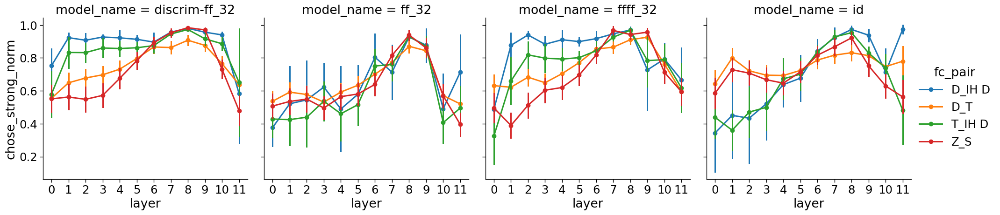

In [174]:
sns.catplot(data=fc_results.groupby(run_groupers + ["layer", "fc_pair", "base_to"]).apply(
    lambda xs: pd.Series({
        "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
        "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
    })) \
    .dropna().reset_index(),
    x="layer", col="model_name", y="chose_strong_norm", hue="fc_pair", kind="point", errorbar="se")

### Exploration

In [175]:
focus_fc_results = fc_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")

In [176]:
focus_fc_results.groupby("fc_pair").sample(4)[["fc_pair", "base_to", "inflected_to", "strong_item_to", "weak_item_to", "base_from", "inflected_from", "predicted_label", "chose_strong", "chose_weak"]]

,fc_pair,base_to,inflected_to,strong_item_to,weak_item_to,base_from,inflected_from,predicted_label,chose_strong,chose_weak
47774,D_IH D,pain,pained,pained,painted paint,burn,burnt,paint,False,True
46813,D_IH D,pain,pained,pained,painted paint,propose,proposed,pane,False,False
47512,D_IH D,plan,planned,planned,planted plant,escort,escorted,planned,True,False
47508,D_IH D,juan,wand,wand,wonted want,result,resulted,wand,True,False
43858,D_T,me,mead,mead meade,meet meat mete,presume,presumed,namely,False,False
44065,D_T,we,we'd,we'd weed,wheat,line,lined,we'd,True,False
45095,D_T,spoil,spoiled,spoiled,spoilt,reproach,reproached,spoiled,True,False
45536,D_T,he,heed,he'd heed,heat,pinch,pinched,he'd,True,False
50458,T_IH D,rap,wrapped,rapped rapt wrapped wrapt,rapid,escape,escaped,rapped,True,False
48800,T_IH D,pain,paint,pained,painted paint,hang,hanged,pained,True,False


/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/

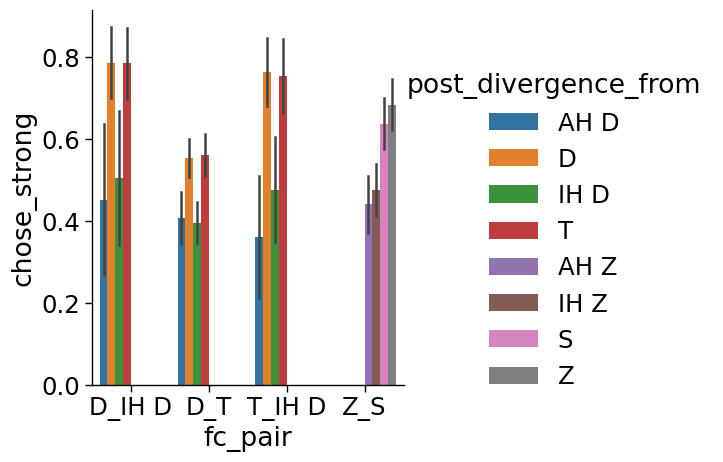

In [324]:
sns.catplot(data=focus_fc_results.groupby(["fc_pair", "post_divergence_from", "base_to"]).chose_strong.mean().dropna().reset_index(),
            x="fc_pair", hue="post_divergence_from", y="chose_strong", kind="bar", errorbar="se")

In [ ]:
# fc_results_by_word = fc_results.groupby(run_groupers + ["layer", "fc_pair", "base_to"]).apply(
#     lambda xs: pd.Series({
#         "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
#         "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum(),
#         "chose_strong_or_weak_proportion": xs.chose_strong_or_weak.mean(),
#     }))
# fc_results_by_word = fc_results_by_word[fc_results_by_word.chose_strong_or_weak_proportion > 0.1] \
#     .dropna().reset_index().sort_values("chose_strong_norm").assign(run_name=lambda xs: xs.model_name + " " + xs.layer.map("{:02d}".format))

# g = sns.FacetGrid(data=fc_results_by_word, col="fc_pair", row="run_name",
#                   row_order=sorted(fc_results_by_word.run_name.unique()),
#                   height=12, aspect=0.6, sharey=False)
# def f(data, **kwargs):
#     sns.heatmap(data=data.set_index("base_to")[["chose_strong_norm", "chose_weak_norm"]],
#                 vmin=0, vmax=1, cbar=False, **kwargs)
# g.map_dataframe(f)

/tmp/ipykernel_2075327/2987038157.py:3: RuntimeWarning: invalid value encountered in scalar divide
  "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_2075327/2987038157.py:4: RuntimeWarning: invalid value encountered in scalar divide
  "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_2075327/2987038157.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  fc_results_by_word = fc_results.groupby(run_groupers + ["layer", "fc_pair", "base_to"]).apply(


/tmp/ipykernel_1259256/1310650070.py:3: RuntimeWarning: invalid value encountered in scalar divide
  "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_1259256/1310650070.py:4: RuntimeWarning: invalid value encountered in scalar divide
  "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
/tmp/ipykernel_1259256/1310650070.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  fc_results_by_word_and_source = focus_fc_results.groupby(run_groupers + ["fc_pair", "post_divergence_from", "base_to"]).apply(
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you 

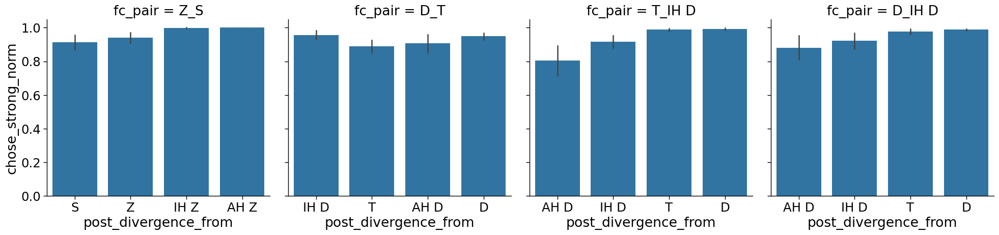

In [177]:
fc_results_by_word_and_source = focus_fc_results.groupby(run_groupers + ["fc_pair", "post_divergence_from", "base_to"]).apply(
    lambda xs: pd.Series({
        "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
        "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
    })) \
    .dropna().reset_index().sort_values("chose_strong_norm")

sns.catplot(data=fc_results_by_word_and_source,
            col="fc_pair", x="post_divergence_from", y="chose_strong_norm",
            kind="bar", errorbar="se", sharex=False)

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


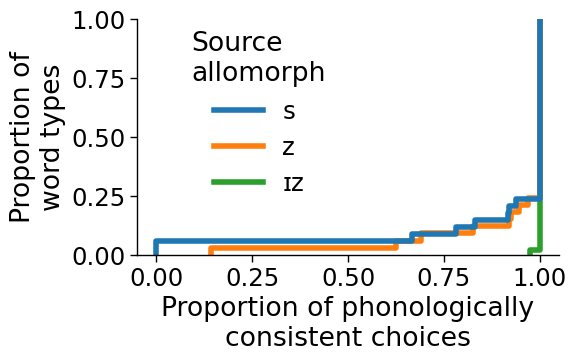

In [178]:
g = sns.displot(data=fc_results_by_word_and_source.query("fc_pair == 'Z_S'").assign(post_divergence_from=lambda xs: xs.post_divergence_from.map({"S": "s", "Z": "z", "IH Z": "ɪz", "AH Z": "ɪz"})),
                hue="post_divergence_from", x="chose_strong_norm",
                kind="ecdf", height=4, aspect=1.5, linewidth=4)

ax = g.axes.flat[0]
ax.set_xlabel("Proportion of phonologically\nconsistent choices")
ax.set_ylabel("Proportion of\nword types")
g.legend.set_title("Source\nallomorph")
g.legend.set_bbox_to_anchor((0.5, 0.6), transform=ax.transAxes)

g.tight_layout()
g.savefig(f"{output_dir}/fc_results-ecdf.pdf", bbox_inches="tight")

In [205]:
# sns.catplot(data=fc_results_by_word_and_source.query("fc_pair == 'Z_S'").assign(post_divergence_from=lambda xs: xs.post_divergence_from.map({"S": "s", "Z": "z", "IH Z": "ɪz", "AH Z": "ɪz"})),
#             col="fc_pair", y="post_divergence_from", x="chose_strong_norm",
#             kind="swarm", height=7, sharex=False)

In [182]:
fc_results_by_word_and_source.query("fc_pair == 'Z_S'").post_divergence_from.value_counts()

post_divergence_from
S       34
Z       33
IH Z    31
AH Z    21
Name: count, dtype: int64

/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/categorical.py:3370: UserWarning: 8.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/categorical.py:3370: UserWarning: 6.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/scratch/jgauthier/transformers/lib/python3.10/site-packages/seaborn/categorical.py:3370: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers o

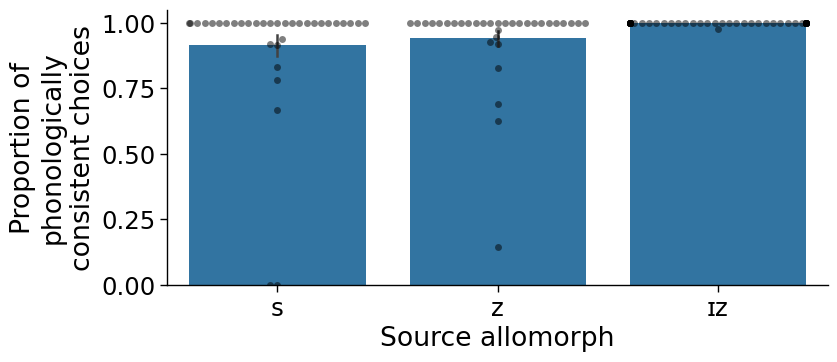

In [198]:
g = sns.catplot(data=fc_results_by_word_and_source.query("fc_pair == 'Z_S'").assign(post_divergence_from=lambda xs: xs.post_divergence_from.map({"S": "s", "Z": "z", "IH Z": "ɪz", "AH Z": "ɪz"})),
                x="post_divergence_from", y="chose_strong_norm",
                kind="bar", errorbar="se", sharex=False, height=4, aspect=2)

ax = g.axes.flat[0]

# overlay swarmplot
sns.swarmplot(data=fc_results_by_word_and_source.query("fc_pair == 'Z_S'").assign(post_divergence_from=lambda xs: xs.post_divergence_from.map({"S": "s", "Z": "z", "IH Z": "ɪz", "AH Z": "ɪz"})),
               x="post_divergence_from", y="chose_strong_norm",
               color="black", alpha=0.5, ax=ax)

ax.set_ylabel("Proportion of\nphonologically\nconsistent choices")
ax.set_xlabel("Source allomorph")

g.savefig(f"{output_dir}/fc_results_by_word_and_source-Z_S.pdf", bbox_inches="tight")

In [324]:
# g = sns.FacetGrid(data=fc_results_by_word_and_source, col="fc_pair", row="post_divergence_from",
#                   height=12, aspect=0.6, sharey=False)
# def f(data, **kwargs):
#     sns.heatmap(data=data.set_index("base_to")[["chose_strong_norm", "chose_weak_norm"]],
#                 vmin=0, vmax=1, cbar=False, **kwargs)
# g.map_dataframe(f)

### Frequency analysis

In [127]:
fc_results = pd.merge(fc_results, word_freq_df.LogFreq.rename("from_base_freq"),
                            left_on="base_from", right_index=True)
fc_results = pd.merge(fc_results, word_freq_df.LogFreq.rename("from_inflected_freq"),
                            left_on="inflected_from", right_index=True)
fc_results = pd.merge(fc_results, word_freq_df.LogFreq.rename("to_base_freq"),
                              left_on="base_to", right_index=True)
fc_results = pd.merge(fc_results, word_freq_df.LogFreq.rename("to_inflected_freq"),
                            left_on="inflected_to", right_index=True)

In [128]:
fc_results["from_freq"] = fc_results[["from_base_freq", "from_inflected_freq"]].mean(axis=1)
fc_results["to_freq"] = fc_results[["to_base_freq", "to_inflected_freq"]].mean(axis=1)

_, fc_frequency_bins = pd.qcut(pd.concat([fc_results.to_freq, fc_results.from_freq]), q=4, retbins=True)
fc_results["from_freq_bin"] = pd.cut(fc_results.from_freq, bins=fc_frequency_bins, labels=[f"Q{i}" for i in range(1, 5)])
fc_results["to_freq_bin"] = pd.cut(fc_results.to_freq, bins=fc_frequency_bins, labels=[f"Q{i}" for i in range(1, 5)])

In [129]:
focus_fc_results = fc_results.query("base_model_name == @focus_base_model and model_name == @focus_model and equivalence == @focus_equivalence")

/tmp/ipykernel_2075327/1612419627.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sns.catplot(data=focus_fc_results.groupby(["fc_pair", "post_divergence_from", "base_to", "from_freq_bin"]).apply(
/tmp/ipykernel_2075327/1612419627.py:3: RuntimeWarning: invalid value encountered in scalar divide
  "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_2075327/1612419627.py:4: RuntimeWarning: invalid value encountered in scalar divide
  "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
/tmp/ipykernel_2075327/1612419627.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_

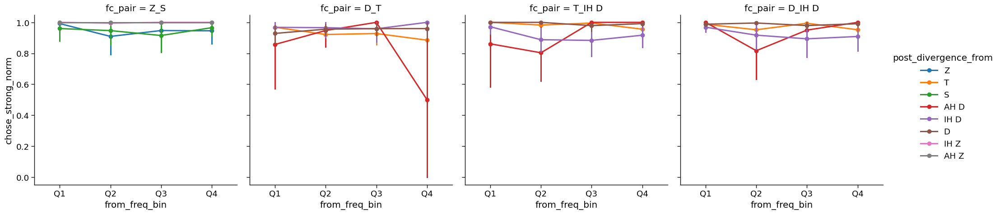

In [130]:
sns.catplot(data=focus_fc_results.groupby(["fc_pair", "post_divergence_from", "base_to", "from_freq_bin"]).apply(
    lambda xs: pd.Series({
        "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
        "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
    })) \
    .dropna().reset_index().sort_values("chose_strong_norm"),
    x="from_freq_bin", y="chose_strong_norm", hue="post_divergence_from", col="fc_pair", kind="point")

/tmp/ipykernel_2075327/2122275798.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sns.catplot(data=focus_fc_results.groupby(["fc_pair", "post_divergence_from", "base_to", "to_freq_bin"]).apply(
/tmp/ipykernel_2075327/2122275798.py:3: RuntimeWarning: invalid value encountered in scalar divide
  "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
/tmp/ipykernel_2075327/2122275798.py:4: RuntimeWarning: invalid value encountered in scalar divide
  "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
/tmp/ipykernel_2075327/2122275798.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_gr

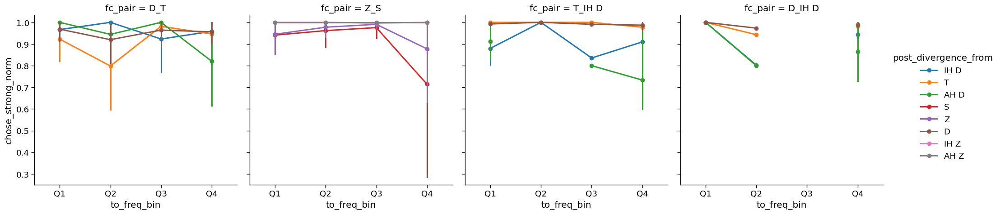

In [131]:
sns.catplot(data=focus_fc_results.groupby(["fc_pair", "post_divergence_from", "base_to", "to_freq_bin"]).apply(
    lambda xs: pd.Series({
        "chose_strong_norm": xs.chose_strong.sum() / xs.chose_strong_or_weak.sum(),
        "chose_weak_norm": xs.chose_weak.sum() / xs.chose_strong_or_weak.sum()
    })) \
    .dropna().reset_index().sort_values("chose_strong_norm"),
    x="to_freq_bin", y="chose_strong_norm", hue="post_divergence_from",  col="fc_pair", kind="point")

## Exploratory for viz

In [315]:
expl = nnvb_focus.query("model_name == 'ffff_32' and ((inflection_from == 'VBZ' and inflection_to == 'NNS') or (inflection_from == 'NNS' and inflection_to == 'VBZ'))").reset_index()
expl.loc[expl.inflection_to == "NNS", "involved_noun"] = expl.base_to
expl.loc[expl.inflection_from == "NNS", "involved_noun"] = expl.base_from
expl.loc[expl.inflection_to == "NNS", "involved_allomorph"] = expl.allomorph_to
expl.loc[expl.inflection_from == "NNS", "involved_allomorph"] = expl.allomorph_from
expl["direction"] = expl.apply(lambda xs: "target" if xs.inflection_from == "VBZ" else "source", axis=1)
# only include stable counts
expl = expl.groupby(["involved_noun", "direction"]).filter(lambda xs: len(xs) > 5)
expl = expl.groupby(["involved_noun", "involved_allomorph", "direction"]).gt_label_rank.mean().unstack().dropna()
expl["ratio"] = (expl.target + 1) / (expl.source + 1)

In [323]:
expl.sort_values("ratio").head(10)

,direction,source,target,ratio
involved_noun,involved_allomorph,,,
friend,z,110.166667,0.000000,0.008996
tank,s,61.454545,0.388889,0.022238
bone,z,71.625000,0.714286,0.023605
list,s,46.647059,0.153846,0.024217
island,z,36.000000,0.000000,0.027027
minute,s,41.117647,0.315789,0.031241
expression,z,30.428571,0.000000,0.031818
specimen,z,28.833333,0.000000,0.033520
apple,z,28.125000,0.000000,0.034335


In [324]:
expl.sort_values("ratio").tail(10)

,direction,source,target,ratio
involved_noun,involved_allomorph,,,
pace,ɪz,3.666667,33.029412,7.292017
hedge,ɪz,2.548387,29.911765,8.711497
improvement,s,3.761905,42.250000,9.082500
artery,z,0.000000,8.625000,9.625000
fountain,z,0.000000,9.000000,10.000000
boundary,z,0.000000,9.142857,10.142857
extremity,z,0.750000,19.500000,11.714286
canoe,z,0.000000,14.857143,15.857143
shore,z,0.000000,25.571429,26.571429


In [319]:
expl.sort_values("target").head(6)

,direction,source,target,ratio
involved_noun,involved_allomorph,,,
expression,z,30.428571,0.0,0.031818
heart,s,8.437500,0.0,0.105960
hat,s,12.058824,0.0,0.076577
habit,s,9.647059,0.0,0.093923
guest,s,8.210526,0.0,0.108571
gown,z,0.000000,0.0,1.000000


In [322]:
expl.sort_values("source").head(6)

,direction,source,target,ratio
involved_noun,involved_allomorph,,,
bundle,z,0.0,0.100000,1.100000
canoe,z,0.0,14.857143,15.857143
boundary,z,0.0,9.142857,10.142857
tale,z,0.0,1.142857,2.142857
artery,z,0.0,8.625000,9.625000
baker,z,0.0,1.250000,2.250000


In [282]:
nnvb_focus.query("model_name == 'ffff_32' and base_to == 'cedar'").gt_label_rank.mean()

25.9

<Axes: xlabel='direction', ylabel='involved_noun'>

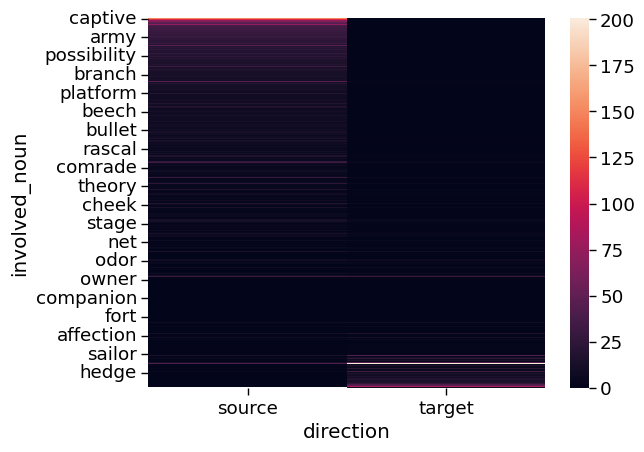

In [270]:
sns.heatmap(expl.sort_values("ratio")[["source", "target"]])

### Exploratory for viz 2

Find a noun N and a verb V for which performance is high within-inflection but for which transfer in one or both directions is poor.

In [335]:
nnvb_focus.query("model_name == 'ffff_32' and inflection_from == inflection_to") \
    .groupby(["inflection_from", "base_to"]).filter(lambda xs: len(xs) > 5) \
    .groupby(["inflection_from", "base_from"]).filter(lambda xs: len(xs) > 5)

,index,equivalence,model_name,base_model_name,Unnamed: 1,group,from_equiv_label,to_equiv_label,base_from,base_to,...,inflected_to,from_base_freq,from_inflected_freq,to_base_freq,to_inflected_freq,from_freq,to_freq,to_freq_bin,from_freq_bin,model_label
experiment,,,,,,,,,,,,,,,,,,,,,
unambiguous-NNS_Z_to_NNS_Z,2995836,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,0,None,"('champion', 'champions')","('sister', 'sisters')",champion,sister,...,sisters,3.072201,2.776376,3.562180,3.029285,2.924288,3.295732,Q4,Q3,Word
unambiguous-NNS_Z_to_NNS_Z,2995839,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,3,None,"('individual', 'individuals')","('contemporary', 'contemporaries')",individual,contemporary,...,contemporaries,3.343798,3.120148,2.927520,1.738005,3.231973,2.332762,Q2,Q4,Word
unambiguous-NNS_Z_to_NNS_Z,2995841,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,5,None,"('turtle', 'turtles')","('exception', 'exceptions')",turtle,exception,...,exceptions,2.400412,2.150531,2.815325,2.369570,2.275471,2.592448,Q2,Q1,Word
unambiguous-NNS_Z_to_NNS_Z,2995842,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,6,None,"('quarter', 'quarters')","('pole', 'poles')",quarter,pole,...,poles,3.476330,2.633283,2.676456,2.160283,3.054807,2.418369,Q2,Q4,Word
unambiguous-NNS_Z_to_NNS_Z,2995846,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,10,None,"('laborer', 'laborers')","('degree', 'degrees')",laborer,degree,...,degrees,1.436011,1.805830,3.270654,3.234269,1.620921,3.252462,Q4,Q1,Word
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unambiguous-VBZ_IH Z_to_VBZ_IH Z,3023249,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,7,None,"('possess', 'possesses')","('please', 'pleases')",possess,please,...,pleases,2.358042,1.914070,4.176827,1.772081,2.136056,2.974454,Q3,Q1,Word
unambiguous-VBZ_IH Z_to_VBZ_IH Z,3023250,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,8,None,"('do', 'does')","('please', 'pleases')",do,please,...,pleases,4.914018,4.245719,4.176827,1.772081,4.579869,2.974454,Q3,Q5,Word
unambiguous-VBZ_IH Z_to_VBZ_IH Z,3023251,word_broad_10frames_fixedlen25,ffff_32,w2v2_8,9,None,"('please', 'pleases')","('do', 'does')",please,do,...,does,4.176827,1.772081,4.914018,4.245719,2.974454,4.579869,Q5,Q3,Word


In [364]:
expl2 = nnvb_focus.query("model_name == 'ffff_32' and inflection_from == inflection_to") \
    .groupby(["inflection_from", "base_to"]).filter(lambda xs: len(xs) > 5) \
    .groupby(["inflection_from", "base_from"]).filter(lambda xs: len(xs) > 5) \

expl2 = pd.DataFrame({
    "target_rank": expl2.groupby(["inflection_from", "base_to"]).gt_label_rank.mean(),
    "source_rank": expl2.groupby(["inflection_from", "base_from"]).gt_label_rank.mean()
}).dropna()
expl2["ratio"] = (expl2.target_rank + 1) / (expl2.source_rank + 1)
expl2.index.names = ["inflection", "label"]

In [365]:
expl2.sort_values("ratio").head(10)

target_rank  source_rank     ratio
inflection label                                       
VBZ        begin        0.363636    20.642857  0.063006
           suggest      0.035088    15.245614  0.063715
NNS        vice         0.105263    16.193548  0.064284
           price        0.307692    17.846154  0.069388
VBZ        come         0.022222    11.369565  0.082640
           possess      0.701754    19.473684  0.083119
NNS        monument     0.071429    11.666667  0.084586
           horse        0.052632    10.000000  0.095694
           meadow       0.000000     9.166667  0.098361
VBZ        exist        0.000000     8.736842  0.102703

In [366]:
expl2.sort_values("ratio").tail(10)

target_rank  source_rank      ratio
inflection label                                         
NNS        cent          4.866667     0.125000   5.214815
           tyrant        8.708333     0.222222   7.943182
           hedge        11.806452     0.568182   8.166433
VBZ        own         283.234043    30.100000   9.139358
NNS        saint         9.190476     0.095238   9.304348
           expert       67.000000     4.904762  11.516129
           hen          12.714286     0.000000  13.714286
           buccaneer    15.428571     0.125000  14.603175
           insect       18.153846     0.066667  17.956731
           turnip       58.733333     0.142857  52.266667

In [367]:
expl2[(expl2.target_rank < 1) & (expl2.source_rank < 1)]

target_rank  source_rank     ratio
inflection label                                           
NNS        accident         0.000000     0.090909  0.916667
           achievement      0.833333     0.416667  1.294118
           acquaintance     0.030303     0.357143  0.759171
           activity         0.000000     0.000000  1.000000
           advantage        0.078947     0.024390  1.053258
...                              ...          ...       ...
VBZ        appear           0.476190     0.510204  0.977477
           become           0.050000     0.782609  0.589024
           eat              0.087719     0.438596  0.756098
           occur            0.023810     0.930233  0.530407
           remind           0.000000     0.837209  0.544304

[248 rows x 3 columns]

In [368]:
transfer_ranks = nnvb_focus.query("model_name == 'ffff_32' and inflection_from != inflection_to") \
    .groupby(["inflection_from", "base_to"]).filter(lambda xs: len(xs) > 5) \
    .groupby(["inflection_from", "base_from"]).filter(lambda xs: len(xs) > 5)

transfer_ranks = pd.DataFrame({
    "source_transfer_rank": transfer_ranks.groupby(["inflection_from", "base_from"]).gt_label_rank.mean(),
    "target_transfer_rank": transfer_ranks.groupby(["inflection_to", "base_to"]).gt_label_rank.mean()
}).dropna()
transfer_ranks.index.names = ["inflection", "label"]
transfer_ranks

source_transfer_rank  target_transfer_rank
inflection label                                                     
NNS        accident                    4.187500              0.000000
           accomplishment              7.875000              0.666667
           achievement                 7.500000              9.000000
           acquaintance                1.961538              2.580645
           advantage                   2.617647              0.621622
...                                         ...                   ...
VBZ        take                        0.494444              0.456989
           tell                        0.327586              0.030769
           tend                        0.353846              8.347222
           think                       0.161290              0.288043
           write                       0.446927             22.584270

[425 rows x 2 columns]

In [378]:
expl3 = pd.merge(expl2, transfer_ranks, left_index=True, right_index=True)
expl3["mean_within"] = (expl3.source_rank + expl3.target_rank) / 2
expl3["mean_transfer"] = (expl3.source_transfer_rank + expl3.target_transfer_rank) / 2
expl3["ratio"] = (expl3.mean_within + 1) / (expl3.mean_transfer + 1)

In [381]:
expl3[(expl3.target_rank < 1) & (expl3.source_rank < 1)]# & (expl3.source_transfer_rank > 1) & (expl3.target_transfer_rank > 1)].sort_values("ratio")

target_rank  source_rank     ratio  \
inflection label                                              
NNS        accident         0.000000     0.090909  0.337925   
           achievement      0.833333     0.416667  0.175676   
           acquaintance     0.030303     0.357143  0.364931   
           advantage        0.078947     0.024390  0.401456   
           adventure        0.250000     0.166667  0.128319   
...                              ...          ...       ...   
VBZ        appear           0.476190     0.510204  1.008303   
           become           0.050000     0.782609  1.305943   
           eat              0.087719     0.438596  0.657307   
           occur            0.023810     0.930233  1.391397   
           remind           0.000000     0.837209  0.997394   

                         source_transfer_rank  target_transfer_rank  \
inflection label                                                      
NNS        accident                  4.187500              0.000000   
           achievement               7.500000              9.000000   
           acquaintance              1.961538              2.580645   
           advantage                 2.617647              0.621622   
           adventure                12.333333              4.500000   
...                                       ...                   ...   
VBZ        appear                    0.135135              0.826667   
           become                    0.169014              0.000000   
           eat                       0.479798              1.363636   
           occur                     0.123077              0.000000   
           remind                    0.716418              0.128205   

                         mean_within  mean_transfer  
inflection label                                     
NNS        accident         0.045455       2.093750  
           achievement      0.625000       8.250000  
           acquaintance     0.193723       2.271092  
           advantage        0.051669       1.619634  
           adventure        0.208333       8.416667  
...                              ...            ...  
VBZ        appear           0.493197       0.480901  
           become           0.416304       0.084507  
           eat              0.263158       0.921717  
           occur            0.477021       0.061538  
           remind           0.418605       0.422312  

[188 rows x 7 columns]